# Final Project - Reinforcements Learning 
---
<br>

### Name and ID:
Student 1: Elad Prager (ID. 200865780)
<br>
Student 2: Shira Moscovitch (ID. 300093150)
<br><br>


## Installs and Imports

In [ ]:
!pip install highway-env
!pip install git+https://github.com/DLR-RM/stable-baselines3
!pip install tensorboardx gym pyvirtualdisplay
!apt-get install -y xvfb python-opengl ffmpeg
!git clone https://github.com/eleurent/highway-env.git 2> /dev/null
!git clone https://github.com/avivg7/highway-config.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 103 kB 6.2 MB/s 
     |████████████████████████████████| 21.8 MB 1.6 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/DLR-RM/stable-baselines3 to /tmp/pip-req-build-_m4hnp8w
  Running command git clone -q https://github.com/DLR-RM/stable-baselines3 /tmp/pip-req-build-_m4hnp8w
     |████████████████████████████████| 1.5 MB 8.0 MB/s 
  Created wheel for stable-baselines3: filename=stable_baselines3-1.6.1a0-py3-none-any.whl size=165533 sha256=2be1d2badd1e7fb4502bbf988bd25549214e0d9d1ab4ffab454b210b9582b0f3
  Stored in directory: /tmp/pip-ephem-wheel-cache-g49qib87/wheels/2b/88/65/5d0cb266b061107af8c518096240bea8578e9843716f79e4da
  Created wheel for gym: filename=gym-0.21.0-py3-none-any.whl size=1616825 sha256=11965eec45082b7d6bec90d0fb8a3f86b6c8e0b30344976ecb59dd7a00b

In [ ]:
!pip install gym[atari]
!pip install autorom[accept-rom-license]
!pip install imageio-ffmpeg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.6 MB 6.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for AutoROM.accept-rom-license: filename=AutoROM.accept_rom_license-0.4.2-py3-none-any.whl size=441027 sha256=436c21d954e0340547b73fc0a442ea2819c1b087a8869e980df62eaf380b6d2e
  Stored in directory: /root/.cache/pip/wheels/87/67/2e/6147e7912fe37f5408b80d07527dab807c1d25f5c403a9538a
Successfully built AutoROM.accept-rom-license
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.9 MB 33.6 MB/s 


In [ ]:
import gym
import highway_env
import sys
sys.path.insert(0, 'highway-env/scripts/')
from tqdm.notebook import trange
import numpy as np
from gym import logger as gymlogger
from gym.wrappers import Monitor
from gym.utils import seeding
from gym import error, spaces, utils
gymlogger.set_level(40) # error only
import io
import base64
import os
import random
import matplotlib.pyplot as plt
import math
import glob
from pyvirtualdisplay import Display
from IPython.display import HTML
from IPython import display as ipythondisplay
import pygame
import json
import ast
%load_ext tensorboard
%matplotlib inline
import warnings
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)

## Display utils
The cell below contains the video display configuration. No need to make changes here.

In [ ]:
display = Display(visible=0, size=(1400, 900))
display.start()

if type(os.environ.get("DISPLAY")) is not str or len(os.environ.get("DISPLAY"))==0:
    !bash ../xvfb start
    %env DISPLAY=:1

"""
Utility functions to enable video recording of gym environment 
and displaying it.
To enable video, just do "env = wrap_env(env)""
"""

def show_video():
  mp4list = glob.glob('video/*.mp4')
  if len(mp4list) > 0:
    mp4 = mp4list[0]
    video = io.open(mp4, 'r+b').read()
    encoded = base64.b64encode(video)
    ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
  else: 
    print("Could not find video")
    

def wrap_env(env):
  env = Monitor(env, './video', force=True)
  return env

# **Common**

## logger

In [ ]:
import logging
import logging.handlers
import os


__all__ = ['init_logger']


def init_logger(log_dir):
    os.makedirs(log_dir, exist_ok=True)
    log_level = logging.INFO
    log_format = '%(levelname)s %(asctime)s %(processName)s %(process)s' \
                 '| %(filename)s | [line:%(lineno)d] | %(message)s'

    logger = logging.getLogger(log_dir)
    if (logger.hasHandlers()):
        logger.handlers.clear()
    logger.setLevel(log_level)
    path = os.path.join(log_dir, 'main.log')

    # file handler (log file)
    log_handler = logging.handlers.RotatingFileHandler(filename=path)
    log_handler.setLevel(log_level)
    log_handler.setFormatter(logging.Formatter(log_format))
    logger.addHandler(log_handler)

    # stream handler (default sys.stderr)
    log_handler = logging.StreamHandler()
    log_handler.setLevel(log_level)
    log_handler.setFormatter(logging.Formatter(log_format))
    logger.addHandler(log_handler)
    return logger


## replay_buffer

In [ ]:
import operator
import random

import numpy as np
import torch


class SegmentTree(object):
    def __init__(self, capacity, operation, neutral_element):
        """Build a Segment Tree data structure"""
        assert capacity > 0 and capacity & (capacity - 1) == 0, \
            "capacity must be positive and a power of 2."
        self._capacity = capacity
        self._value = [neutral_element for _ in range(2 * capacity)]
        self._operation = operation

    def _reduce_helper(self, start, end, node, node_start, node_end):
        if start == node_start and end == node_end:
            return self._value[node]
        mid = (node_start + node_end) // 2
        if end <= mid:
            return self._reduce_helper(start, end, 2 * node, node_start, mid)
        else:
            if mid + 1 <= start:
                return self._reduce_helper(start, end,
                                           2 * node + 1, mid + 1, node_end)
            else:
                return self._operation(
                    self._reduce_helper(start, mid,
                                        2 * node, node_start, mid),
                    self._reduce_helper(mid + 1, end,
                                        2 * node + 1, mid + 1, node_end)
                )

    def reduce(self, start=0, end=None):
        """Returns result of applying `self.operation`
        to a contiguous subsequence of the array"""
        if end is None:
            end = self._capacity
        if end < 0:
            end += self._capacity
        end -= 1
        return self._reduce_helper(start, end, 1, 0, self._capacity - 1)

    def __setitem__(self, idx, val):
        # index of the leaf
        idx += self._capacity
        self._value[idx] = val
        idx //= 2
        while idx >= 1:
            self._value[idx] = self._operation(
                self._value[2 * idx],
                self._value[2 * idx + 1]
            )
            idx //= 2

    def __getitem__(self, idx):
        assert 0 <= idx < self._capacity
        return self._value[self._capacity + idx]


class SumSegmentTree(SegmentTree):
    def __init__(self, capacity):
        super(SumSegmentTree, self).__init__(
            capacity=capacity,
            operation=operator.add,
            neutral_element=0.0
        )

    def sum(self, start=0, end=None):
        """Returns arr[start] + ... + arr[end]"""
        return super(SumSegmentTree, self).reduce(start, end)

    def find_prefixsum_idx(self, prefixsum):
        """Find the highest index `i` in the array"""
        assert 0 <= prefixsum <= self.sum() + 1e-5
        idx = 1
        while idx < self._capacity:  # while non-leaf
            if self._value[2 * idx] > prefixsum:
                idx = 2 * idx
            else:
                prefixsum -= self._value[2 * idx]
                idx = 2 * idx + 1
        return idx - self._capacity


class MinSegmentTree(SegmentTree):
    def __init__(self, capacity):
        super(MinSegmentTree, self).__init__(
            capacity=capacity,
            operation=min,
            neutral_element=float('inf')
        )

    def min(self, start=0, end=None):
        """Returns min(arr[start], ...,  arr[end])"""
        return super(MinSegmentTree, self).reduce(start, end)


class ReplayBuffer(object):
    def __init__(self, size, device):
        """Create Replay buffer"""
        self._storage = []
        self._maxsize = size
        self._next_idx = 0
        self._device = device

    def __len__(self):
        return len(self._storage)

    def add(self, *args):
        if self._next_idx >= len(self._storage):
            self._storage.append(args)
        else:
            self._storage[self._next_idx] = args
        self._next_idx = (self._next_idx + 1) % self._maxsize

    def _encode_sample(self, idxes):
        b_o, b_a, b_r, b_o_, b_d = [], [], [], [], []
        b_extras = [[] for _ in range(len(self._storage[0]) - 5)]
        for i in idxes:
            o, a, r, o_, d, *extras = self._storage[i]
            b_o.append(o.astype('float32'))
            b_a.append(a)
            b_r.append(r)
            b_o_.append(o_.astype('float32'))
            b_d.append(d)
            for j, extra in enumerate(extras):
                b_extras[j].append(extra)
        res = (
            torch.from_numpy(np.asarray(b_o)).to(self._device),
            torch.from_numpy(np.asarray(b_a)).to(self._device).long(),
            torch.from_numpy(np.asarray(b_r)).to(self._device).float(),
            torch.from_numpy(np.asarray(b_o_)).to(self._device),
            torch.from_numpy(np.asarray(b_d)).to(self._device).float(),
        ) + tuple(
            torch.from_numpy(np.asarray(b_extra)).to(self._device).float()
            for b_extra in b_extras
        )
        return res

    def sample(self, batch_size):
        """Sample a batch of experiences."""
        indexes = range(len(self._storage))
        idxes = [random.choice(indexes) for _ in range(batch_size)]
        return self._encode_sample(idxes)


class PrioritizedReplayBuffer(ReplayBuffer):
    def __init__(self, size, device, alpha, beta):
        """Create Prioritized Replay buffer"""
        super(PrioritizedReplayBuffer, self).__init__(size, device)
        assert alpha >= 0
        self._alpha = alpha

        it_capacity = 1
        while it_capacity < size:
            it_capacity *= 2

        self._it_sum = SumSegmentTree(it_capacity)
        self._it_min = MinSegmentTree(it_capacity)
        self._max_priority = 1.0
        self.beta = beta

    def add(self, *args, **kwargs):
        """See ReplayBuffer.store_effect"""
        idx = self._next_idx
        super().add(*args, **kwargs)
        self._it_sum[idx] = self._max_priority ** self._alpha
        self._it_min[idx] = self._max_priority ** self._alpha

    def _sample_proportional(self, batch_size):
        res = []
        p_total = self._it_sum.sum(0, len(self._storage) - 1)
        every_range_len = p_total / batch_size
        for i in range(batch_size):
            mass = random.random() * every_range_len + i * every_range_len
            idx = self._it_sum.find_prefixsum_idx(mass)
            res.append(idx)
        return res

    def sample(self, batch_size):
        """Sample a batch of experiences"""
        idxes = self._sample_proportional(batch_size)

        it_sum = self._it_sum.sum()
        p_min = self._it_min.min() / it_sum
        max_weight = (p_min * len(self._storage)) ** (-self.beta)

        p_samples = np.asarray([self._it_sum[idx] for idx in idxes]) / it_sum
        weights = (p_samples * len(self._storage)) ** (-self.beta) / max_weight
        weights = torch.from_numpy(weights.astype('float32'))
        weights = weights.to(self._device).unsqueeze(1)
        encoded_sample = self._encode_sample(idxes)
        return encoded_sample + (weights, idxes)

    def update_priorities(self, idxes, priorities):
        """Update priorities of sampled transitions"""
        assert len(idxes) == len(priorities)
        for idx, priority in zip(idxes, priorities):
            assert priority > 0
            assert 0 <= idx < len(self._storage)
            self._it_sum[idx] = priority ** self._alpha
            self._it_min[idx] = priority ** self._alpha

            self._max_priority = max(self._max_priority, priority)


C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## util

In [ ]:
import os
import random
import re
from functools import partial
from importlib import import_module
from multiprocessing import cpu_count
from sys import platform
import ast

import gym
import numpy as np
import torch
import torch.nn as nn


def build_env(env_id, algorithm, env_type, seed, log_path, **kwargs):
    """ Build env based on options """
    assert env_type in {'atari', 'classic_control', 'box2d'}
    reward_scale = kwargs.pop('reward_scale')
    nenv = kwargs.pop('nenv') or cpu_count() // (1 + (platform == 'darwin'))
    stack = env_type == 'atari'
    if algorithm == 'dqn':
        env = make_env(env_id, env_type, seed, reward_scale, log_path, kwargs['config_file'], stack)

    return env, kwargs


def make_env(env_id, env_type, seed, reward_scale, log_path, config_file, frame_stack=False):
    """ Make env """
    actor_log_path = os.path.join(log_path, 'actor.log.{}'.format(str(seed)))
    if env_type == 'atari':
        env = gym.make(env_id)

        file = open('highway-config/' + config_file, 'r')
        contents = file.read()
        config = ast.literal_eval(contents)
        env.configure(config)
        print(env.config)
        env.config['observation']['stack_size']=1
        env.config['observation']['scaling']=5.5
        file.close()
               
        env = Info(env, actor_log_path)
        env = WarpFrame(env)
        env = ClipRewardEnv(env)
        if frame_stack:
            env = FrameStack(env, 1)

    if reward_scale != 1:
        env = RewardScaler(env, reward_scale)
    env.seed(seed)
    return env


def set_global_seeds(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)


def scale_ob(array, device, scale):
    return torch.from_numpy(array.astype(np.float32) * scale).to(device)


class Flatten(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        return x.contiguous().view(x.size(0), -1)


## wrappers

In [ ]:
from collections import deque
from multiprocessing import Process, Pipe

import cv2
import gym
import numpy as np
from gym import spaces
import random


__all__ = (
    'ClipRewardEnv',  # clip reward wrapper
    'WarpFrame',  # warp observation wrapper
    'FrameStack',  # stack frame wrapper
    'LazyFrames',  # lazy store wrapper
    'RewardScaler',  # reward scale
    'Info',  # Episode reward and length info
)
cv2.ocl.setUseOpenCL(False)


class ClipRewardEnv(gym.RewardWrapper):
    def __init__(self, env):
        super(ClipRewardEnv, self).__init__(env)

    def reward(self, reward):
        """Bin reward to {+1, 0, -1} by its sign."""
        return np.sign(reward)


class WarpFrame(gym.ObservationWrapper):
    def __init__(self, env, width=84, height=84, grayscale=True):
        """Warp frames to 84x84 as done in the Nature paper and later work."""
        super(WarpFrame, self).__init__(env)
        self.width = width
        self.height = height
        self.grayscale = grayscale
        shape = (1 if self.grayscale else 3, self.height, self.width)
        self.observation_space = spaces.Box(
            low=0, high=255, shape=shape, dtype=np.uint8
        )

    def observation(self, frame):
        #if self.grayscale:
        #   frame = cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
        frame = frame.transpose((1, 2, 0))
        size = (self.width, self.height)
        frame = cv2.resize(frame, size, interpolation=cv2.INTER_AREA)
        if self.grayscale:
          frame = np.expand_dims(frame, -1)
        return frame.transpose((2, 0, 1))


class FrameStack(gym.Wrapper):
    def __init__(self, env, k):
        """Stack k last frames"""
        super(FrameStack, self).__init__(env)
        self.k = k
        self.frames = deque([], maxlen=k)
        shp = env.observation_space.shape
        shape = (shp[0] * k, ) + shp[1:]
        self.observation_space = spaces.Box(
            low=0, high=255, shape=shape, dtype=env.observation_space.dtype
        )

    def reset(self):
        ob = self.env.reset()
        for _ in range(self.k):
            self.frames.append(ob)
        return np.asarray(self._get_ob())

    def step(self, action):
        ob, reward, done, info = self.env.step(action)
        self.frames.append(ob)
        return np.asarray(self._get_ob()), reward, done, info

    def _get_ob(self):
        assert len(self.frames) == self.k
        return LazyFrames(list(self.frames))


class LazyFrames(object):
    def __init__(self, frames):
        """This object ensures that common frames between the observations are
        only stored once. It exists purely to optimize memory usage which can be
        huge for DQN's 1M frames replay buffers"""
        self._frames = frames
        self._out = None

    def _force(self):
        if self._out is None:
            self._out = np.concatenate(self._frames, axis=-3)
            self._frames = None
        return self._out

    def __array__(self, dtype=None):
        out = self._force()
        if dtype is not None:
            out = out.astype(dtype)
        return out

    def __len__(self):
        return len(self._force())

    def __getitem__(self, i):
        return self._force()[i]


class RewardScaler(gym.RewardWrapper):
    """Bring rewards to a reasonable scale for PPO"""
    def __init__(self, env, scale=0.01):
        super(RewardScaler, self).__init__(env)
        self.scale = scale

    def reward(self, reward):
        return reward * self.scale


class Info(gym.Wrapper):
    def __init__(self, env, actor_log_path):
        super(Info, self).__init__(env)
        self._monitor_rewards = None
        self._actor_log_path = actor_log_path

    def reset(self, **kwargs):
        self._monitor_rewards = []
        return self.env.reset(**kwargs)

    def step(self, action):
        o_, r, done, info = self.env.step(action)
        self._monitor_rewards.append(r)
        if done:
            info['episode'] = {
                'r': sum(self._monitor_rewards),
                'l': len(self._monitor_rewards)}
            with open(self._actor_log_path, 'a') as f:
                f.write('{}\t{}\n'
                        .format(info['episode']['r'], info['episode']['l']))
        return o_, r, done, info


## train

In [ ]:
import math
import os
import random
import time
from collections import deque
from copy import deepcopy

import numpy as np
import torch
import torch.distributions
import torch.nn as nn
from torch.nn.functional import softmax, log_softmax


def train(logger,
          device, env,
          number_timesteps,
          network, optimizer,
          save_path, save_interval, ob_scale,
          gamma, grad_norm,
          double_q,
          exploration_fraction, exploration_final_eps, stochastic_env,
          batch_size, train_freq, learning_starts, target_network_update_freq,
          buffer_size, prioritized_replay, prioritized_replay_alpha,
          prioritized_replay_beta0, atom_num, min_value, max_value, config_file, keep_training_from_checkpoint, **kwargs):

    qnet = network.to(device)
    qtar = deepcopy(qnet)
    if prioritized_replay:
        buffer = PrioritizedReplayBuffer(buffer_size, device,
                                         prioritized_replay_alpha,
                                         prioritized_replay_beta0)
    else:
        buffer = ReplayBuffer(buffer_size, device)
    generator = _generate(device, env, qnet, ob_scale,
                          number_timesteps,
                          exploration_fraction, exploration_final_eps,
                          atom_num, min_value, max_value, stochastic_env)
    if atom_num > 1:
        delta_z = float(max_value - min_value) / (atom_num - 1)
        z_i = torch.linspace(min_value, max_value, atom_num).to(device)

    infos = {'eplenmean': deque(maxlen=100), 'eprewmean': deque(maxlen=100)}
    start_ts = time.time()
    rewards = []
    steps = []
    losses = []
    for n_iter in range(1, number_timesteps + 1):

        if prioritized_replay:
            buffer.beta += (1 - prioritized_replay_beta0) / number_timesteps
        *data, info = generator.__next__()
        buffer.add(*data)
        for k, v in info.items():
            infos[k].append(v)

        # update qnet
        if n_iter > learning_starts and n_iter % train_freq == 0:
            b_o, b_a, b_r, b_o_, b_d, *extra = buffer.sample(batch_size)
            b_o.mul_(ob_scale)
            b_o_.mul_(ob_scale)

            if atom_num == 1:
                with torch.no_grad():
                    if double_q:
                        b_a_ = qnet(b_o_).argmax(1).unsqueeze(1)
                        b_q_ = (1 - b_d) * qtar(b_o_).gather(1, b_a_)
                    else:
                        b_q_ = (1 - b_d) * qtar(b_o_).max(1, keepdim=True)[0]
                b_q = qnet(b_o).gather(1, b_a)
                abs_td_error = (b_q - (b_r + gamma * b_q_)).abs()
                priorities = abs_td_error.detach().cpu().clamp(1e-6).numpy()
                if extra:
                    loss = (extra[0] * huber_loss(abs_td_error)).mean()
                else:
                    loss = huber_loss(abs_td_error).mean()
            else:
                with torch.no_grad():
                    b_dist_ = qtar(b_o_).exp()
                    b_a_ = (b_dist_ * z_i).sum(-1).argmax(1)
                    b_tzj = (gamma * (1 - b_d) * z_i[None, :]
                             + b_r).clamp(min_value, max_value)
                    b_i = (b_tzj - min_value) / delta_z
                    b_l = b_i.floor()
                    b_u = b_i.ceil()
                    b_m = torch.zeros(batch_size, atom_num).to(device)
                    temp = b_dist_[torch.arange(batch_size), b_a_, :]
                    b_m.scatter_add_(1, b_l.long(), temp * (b_u - b_i))
                    b_m.scatter_add_(1, b_u.long(), temp * (b_i - b_l))
                b_q = qnet(b_o)[torch.arange(batch_size), b_a.squeeze(1), :]
                kl_error = -(b_q * b_m).sum(1)

                priorities = kl_error.detach().cpu().clamp(1e-6).numpy()
                loss = kl_error.mean()

            optimizer.zero_grad()
            loss.backward()
            if grad_norm is not None:
                nn.utils.clip_grad_norm_(qnet.parameters(), grad_norm)
            optimizer.step()
            if prioritized_replay:
                buffer.update_priorities(extra[1], priorities)

        # update target net and log
        if n_iter % target_network_update_freq == 0:
            qtar.load_state_dict(qnet.state_dict())
            logger.info('{} Iter {} {}'.format('=' * 10, n_iter, '=' * 10))
            fps = int(n_iter / (time.time() - start_ts))
            logger.info('Total timesteps {} FPS {}'.format(n_iter, fps))
            for k, v in infos.items():
                v = (sum(v) / len(v)) if v else float('nan')
                logger.info('{}: {:.6f}'.format(k, v))
            if n_iter > learning_starts and n_iter % train_freq == 0:
                logger.info('vloss: {:.6f}'.format(loss.item()))

        # Capture states for graphs
        if n_iter % 10 == 0:
            R=infos['eprewmean']
            R = (sum(R) / len(R)) if R else float('nan') 
            rewards.append(R)

            L=infos['eplenmean']
            L = (sum(L) / len(L)) if L else float('nan') 
            steps.append(L)

            if n_iter > learning_starts :
              losses.append(loss.item())

        if save_interval and n_iter % save_interval == 0:
            torch.save([qnet.state_dict(), optimizer.state_dict()],
                       os.path.join(save_path, '{}.checkpoint'.format(n_iter)))
    
    return rewards, steps, losses


def _generate(device, env, qnet, ob_scale,
              number_timesteps,
              exploration_fraction, exploration_final_eps,
              atom_num, min_value, max_value, stochastic_env):
    """ Generate training batch sample """
    action_dim = env.action_space.n
    explore_steps = number_timesteps * exploration_fraction
    if atom_num > 1:
        vrange = torch.linspace(min_value, max_value, atom_num).to(device)
    o = env.reset()
    infos = dict()
    for n in range(1, number_timesteps + 1):

        epsilon = 1.0 - (1.0 - exploration_final_eps) * n / explore_steps
        epsilon = max(exploration_final_eps, epsilon)

        # sample action
        with torch.no_grad():
            ob = scale_ob(np.expand_dims(o, 0), device, ob_scale)
            q = qnet(ob)
            if atom_num > 1:
                q = (q.exp() * vrange).sum(2)
            if (random.random() < epsilon) or ((stochastic_env == True) and (random.random() < 0.15)):
                a = int(random.random() * action_dim)
            else:
                a = q.argmax(1).cpu().numpy()[0]
          
        o_, r, done, info = env.step(a)
        if info.get('episode'):
            infos = {
                'eplenmean': info['episode']['l'],
                'eprewmean': info['episode']['r'],
            }
        # return data and update observation
        yield (o, [a], [r], o_, [int(done)], infos)
        infos = dict()
        o = o_ if not done else env.reset()


def huber_loss(abs_td_error):
    flag = (abs_td_error < 1).float()
    return flag * abs_td_error.pow(2) * 0.5 + (1 - flag) * (abs_td_error - 0.5)


## network setup

In [ ]:
class CNN(nn.Module):
    def __init__(self, in_shape, out_dim, atom_num, dueling):
        super().__init__()
        c, h, w = in_shape
        cnn_out_dim = 64 * ((h - 28) // 8) * ((w - 28) // 8)
        self.atom_num = atom_num
        self.feature = nn.Sequential(
            nn.Conv2d(c, 32, 8, 4),
            nn.ReLU(True),
            nn.Conv2d(32, 64, 4, 2),
            nn.ReLU(True),
            nn.Conv2d(64, 64, 3, 1),
            nn.ReLU(True),
            Flatten(),
        )

        self.q = nn.Sequential(
            nn.Linear(cnn_out_dim, 256),
            nn.ReLU(True),
            nn.Linear(256, out_dim * atom_num)
        )
        if dueling:
            self.state = nn.Sequential(
                nn.Linear(cnn_out_dim, 256),
                nn.ReLU(True),
                nn.Linear(256, atom_num)
            )

        for _, m in self.named_modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        batch_size = x.size(0)
        latent = self.feature(x)
        qvalue = self.q(latent)
        if self.atom_num == 1:
            if hasattr(self, 'state'):
                svalue = self.state(latent)
                qvalue = svalue + qvalue - qvalue.mean(1, keepdim=True)
            return qvalue
        else:
            qvalue = qvalue.view(batch_size, -1, self.atom_num)
            if hasattr(self, 'state'):
                svalue = self.state(latent).unsqueeze(1)
                qvalue = svalue + qvalue - qvalue.mean(1, keepdim=True)
            logprobs = log_softmax(qvalue, -1)
            return logprobs

## run

In [ ]:
import torch.nn as nn
from torch.nn.functional import log_softmax
from torch.optim import Adam
import os
import random
import re
from functools import partial
from importlib import import_module
from multiprocessing import cpu_count
from sys import platform
import shutil
import gym
import numpy as np
import torch
import argparse
import os
import torch
import highway_env


def run(env_id, algorithm, env_type, seed, log_path, **kwargs):
    """ Learn entry """
    sub_folder = '{}_{}_{}'.format(env_id, algorithm, seed)
    log_path = os.path.join(log_path, sub_folder)
    logger = init_logger(log_path)

    set_global_seeds(seed)

    env, kwargs = build_env(env_id, algorithm,
                            env_type, seed, log_path, **kwargs)
    algorithm = algorithm.lower()
    
    kwargs = train_setup(env, **kwargs)
    s = '\n' + '-' * 60 + '\n'
    option_repr = ''.join(
        '{}{}: {}'.format(s, k, v.__repr__()) for k, v in kwargs.items()) + s
    logger.info('Start training `{}` on `{}` with settings {}'
                .format(algorithm, env, option_repr))
    try:
        return train(env=env, **kwargs)
    except Exception as e:
        logger.critical('algorithm execute fail', exc_info=e)

def train_setup(env, **kwargs):
    in_dim = env.observation_space.shape
    policy_dim = env.action_space.n
    network = CNN(in_dim, policy_dim, kwargs['atom_num'], kwargs['dueling'])
    optimizer = Adam(network.parameters(), kwargs['lr'], eps=1e-5)
    if kwargs['keep_training_from_checkpoint'] == True:
        model = network.to(kwargs['device'])
        checkpoint = torch.load(str(kwargs['save_path']) + '/' + str(kwargs['save_interval']) + '.checkpoint')
        model.load_state_dict(checkpoint[0])
        optimizer.load_state_dict(checkpoint[1])
    kwargs.update(network=network, optimizer=optimizer)
    return kwargs



## test function

In [ ]:
def test(**kwargs):
    set_global_seeds(kwargs['seed'])

    # build env, set model and optimizer
    env = make_env(kwargs['env_id'], kwargs['env_type'], kwargs['seed'], kwargs['reward_scale'], kwargs['log_path'], kwargs['config_file'])
    in_dim = env.observation_space.shape
    policy_dim = env.action_space.n
    model = CNN(in_dim, policy_dim, kwargs['atom_num'], kwargs['dueling'])
    optimizer = Adam(model.parameters(), kwargs['lr'], eps=1e-5)

    # load model
    checkpoint = torch.load(kwargs['checkpoint_path'])
    model.load_state_dict(checkpoint[0])
    optimizer.load_state_dict(checkpoint[1])
    model.eval()

    # test setup
    qnet = model.to(kwargs['device'])
    if kwargs['atom_num'] > 1:
        vrange = torch.linspace(kwargs['min_value'], kwargs['max_value'], kwargs['atom_num']).to(kwargs['device'])
    env = wrap_env(env)
    o = env.reset()
    action_dim = env.action_space.n
    
    # test parameters
    done = False
    iter = 0
    number_timesteps = 500

    # test iterations
    for n in range(1, number_timesteps + 1):
        if done:
          break
        ob = scale_ob(np.expand_dims(o, 0), kwargs['device'], kwargs['ob_scale'])
        q = qnet(ob)
        if kwargs['atom_num'] > 1:
            q = (q.exp() * vrange).sum(2)

        # choose best action
        if ((kwargs['stochastic_env'] == True) and (random.random() < 0.15)):
            a = int(random.random() * action_dim)
        else:
            a = q.argmax(1).cpu().numpy()[0]
        
        o, r, done, info = env.step(a)
        
        if info.get('episode'):
            eplenmean = info['episode']['l']
            eprewmean = info['episode']['r']
            print(f'\neplenmean is: {eplenmean}')
            print(f'eprewmean is: {round(eprewmean,2)}\n')

        iter +=1

    env.close()

## plot function

In [ ]:
def plot_results(rewards, losses, labels):
  episodes = np.arange(len(rewards[0]))*10
  plt.figure(figsize=(16, 8))
  for i, r in enumerate(rewards):
      plt.plot(episodes, r, label=labels[i])
  plt.suptitle("Average Reward per 100 Episodes", fontsize=18)
  plt.ylabel('Average Reward', fontsize=12)
  plt.xlabel("Episodes", fontsize=12)
  plt.legend(loc="upper left")
  plt.show()

  # Plot Loss     
  learning_starts = int(train_kwargs['learning_starts']/10)
  plt.figure(figsize=(16, 8))
  for i, l in enumerate(losses):
      plt.plot(episodes[learning_starts:], l, label=labels[i])
  plt.suptitle("Loss per Episode", fontsize=18)
  plt.ylabel('Loss', fontsize=12)
  plt.xlabel("Episodes", fontsize=12)
  plt.legend(loc="upper left")
  plt.show()

## experiments function

In [ ]:
def experiment(values, label):
  print(f'\n########## tuning {label}: ##########\n')
  for item in values:  
      print(f'set value to: {item}')
      old_value = train_kwargs[label]
      train_kwargs[label] = item
      experiment_rewards, experiment_steps, experiment_losses = main()
      print(f'\nnum of avg rewards before done in the last 100 episodes: {experiment_rewards[-1]}')
      print(f'num of avg steps before done in the last 100 episodes: {experiment_steps[-1]}\n')
      train_kwargs[label] = old_value
      plot_results([baseline_rewards, experiment_rewards], [baseline_losses, experiment_losses], [f'{label}={train_kwargs[label]}', f'{label}={item}'])

# **Ex1 - Highway-Env - Grayscale Image - Easy**

### train

INFO 2022-07-26 08:54:27,228 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----

{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 08:54:42,486 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 08:54:42,488 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 4
INFO 2022-07-26 08:54:42,492 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 08:54:42,498 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 08:54:44,343 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 08:54:44,345 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 8
INFO 2022-07-26 08:54:44,348 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 08:54:44,356 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 08:54:45,985 MainProcess 72| <ipython-input-9-d5229f28c240> 

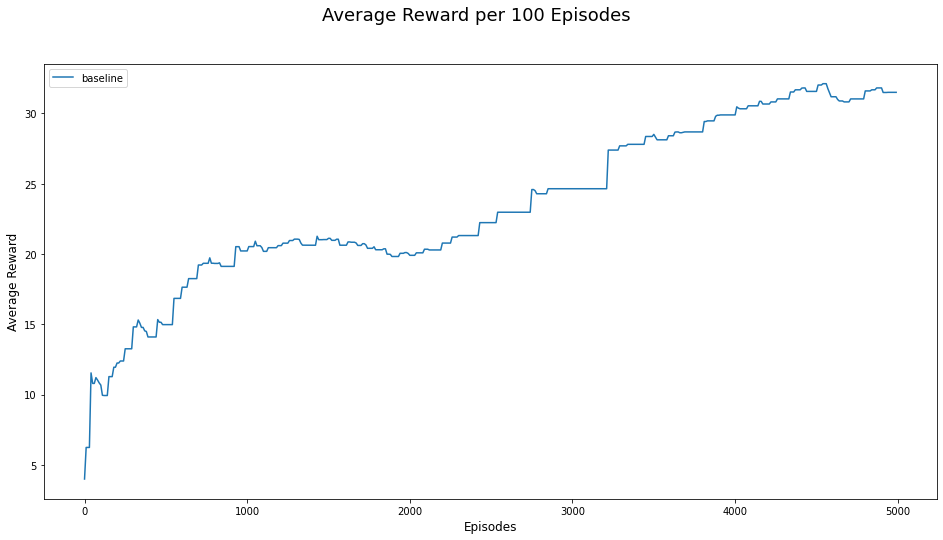

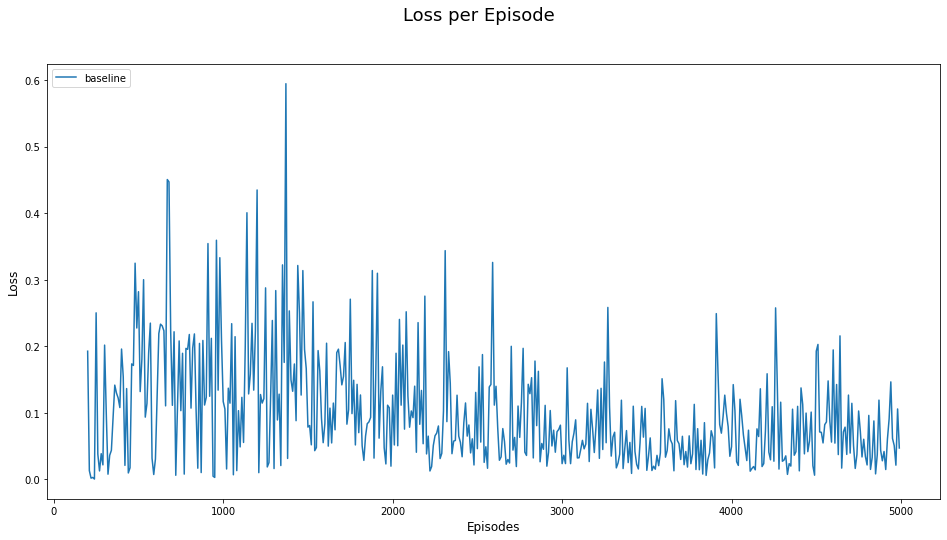

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs',
    logger=init_logger('logs'),
    env_id='highway-fast-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(5e3),
    reward_scale=1.0,
    save_path='checkpoints',
    save_interval=int(1e3),
    config_file='config_ex1.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=15000,
    exploration_fraction=0.2,
    exploration_final_eps=0.05,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=50,
    gamma=0.8,
    prioritized_replay=False,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=False,
    atom_num=1,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )

def main():
    if not os.path.isdir('checkpoints'):
        os.mkdir('checkpoints')  
    return run(**train_kwargs)
    
baseline_rewards, baseline_steps, baseline_losses = main()
plot_results([baseline_rewards], [baseline_losses], ['baseline'])

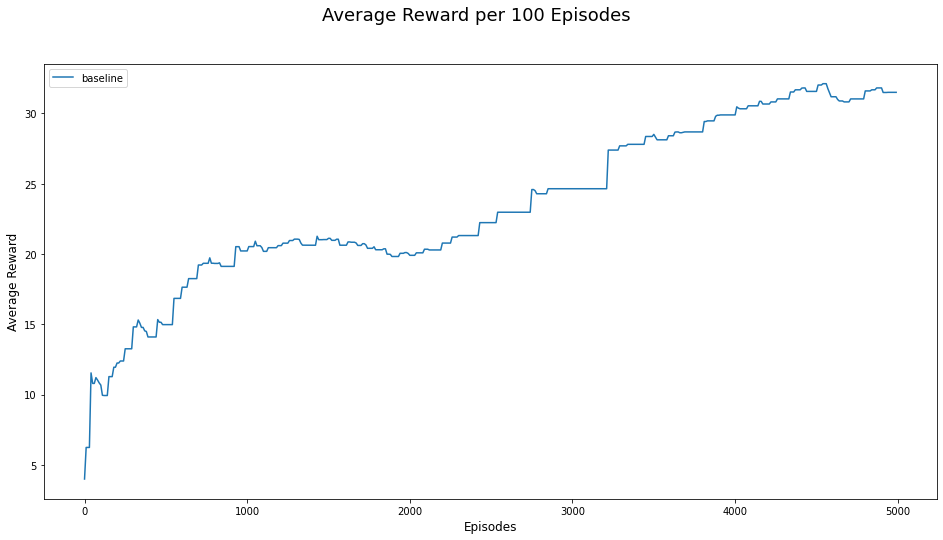

## test

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints/5000.checkpoint',
    log_path='logs',
    config_file='config_ex1.txt',
    stochastic_env=False,
    dueling=False,
    atom_num=1,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='highway-fast-v0',
    env_type='atari',
    seed=0,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

test(**test_kwargs)
show_video()

{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}

eplenmean is: 42
eprewmean is: 36.5



## experiments

algorithmic experiments

In [ ]:
# Algorithmic Tuning 
double_q = [True]
prioritized_replay = [True]
dueling = [True]
atom_num = [51]

INFO 2022-07-26 09:49:17,162 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning double_q: ##########

set value to: True
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:49:18,996 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:49:18,997 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 27
INFO 2022-07-26 09:49:19,000 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:49:19,001 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:49:20,835 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:49:20,837 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 27
INFO 2022-07-26 09:49:20,840 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:49:20,841 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:49:22,448 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 30.32022249730735
num of avg steps before done in the last 100 episodes: 38.01



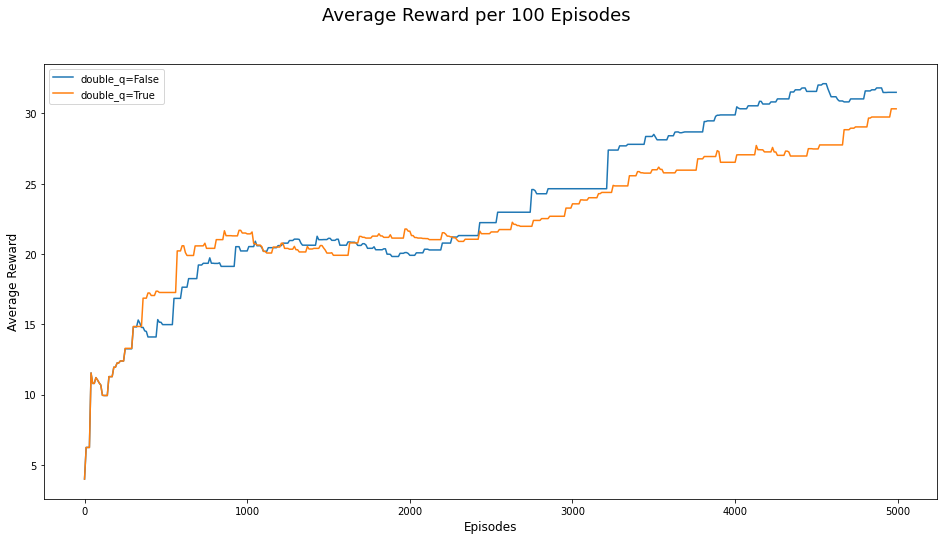

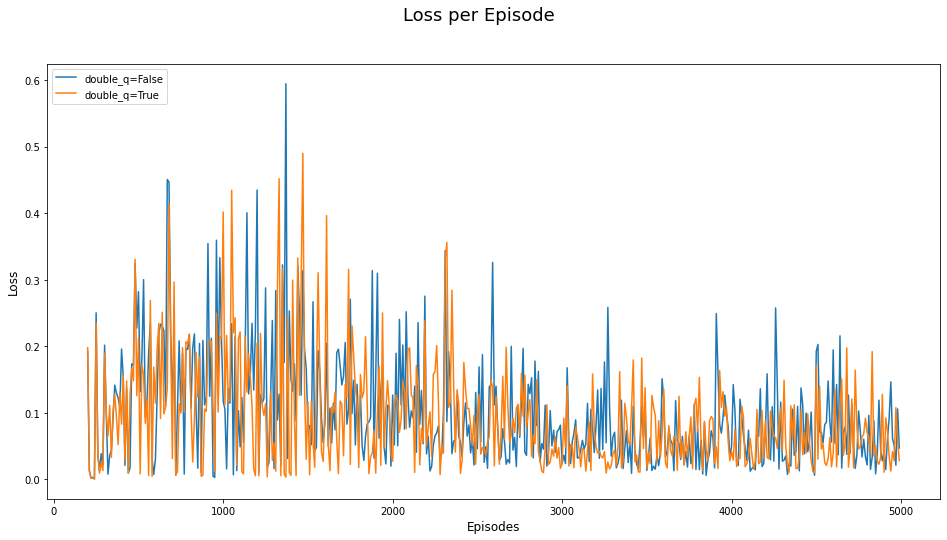

In [ ]:
experiment(double_q, 'double_q')

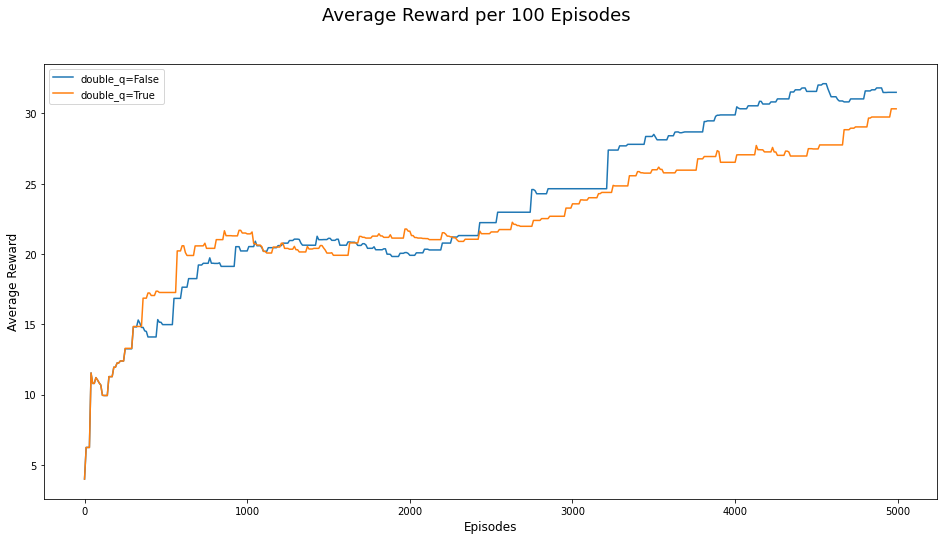

INFO 2022-07-26 09:01:26,604 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning prioritized_replay: ##########

set value to: True
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:01:28,487 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:01:28,488 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 26
INFO 2022-07-26 09:01:28,494 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:01:28,496 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:01:30,342 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:01:30,344 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 26
INFO 2022-07-26 09:01:30,348 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:01:30,350 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:01:32,000 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 35.59432101666378
num of avg steps before done in the last 100 episodes: 45.3



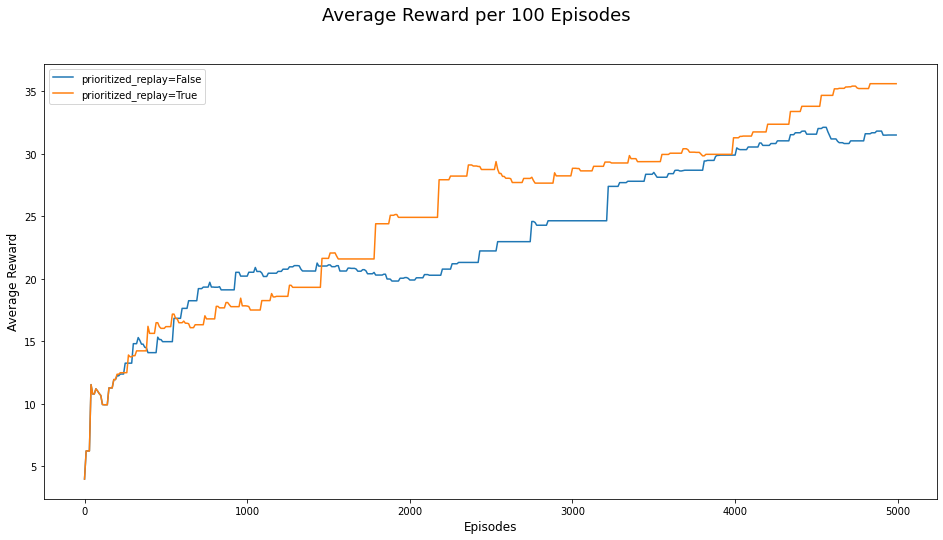

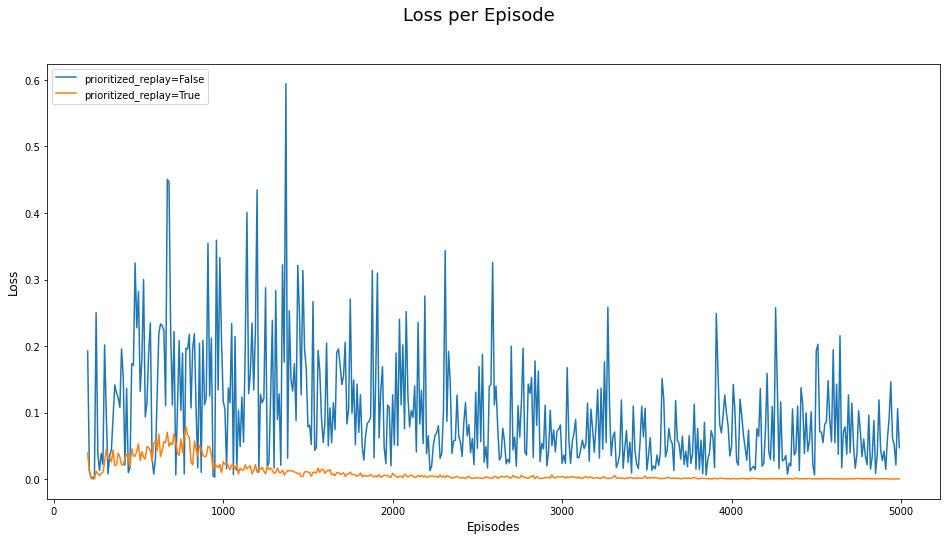

In [ ]:
experiment(prioritized_replay, 'prioritized_replay')

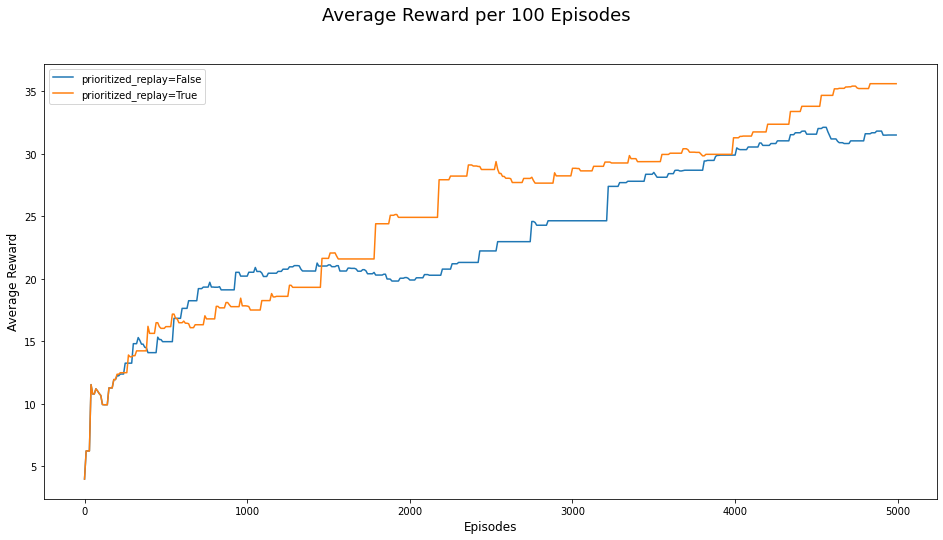

INFO 2022-07-26 09:04:16,751 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning dueling: ##########

set value to: True
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:04:18,623 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:04:18,624 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 26
INFO 2022-07-26 09:04:18,629 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:04:18,633 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:04:20,483 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:04:20,485 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 26
INFO 2022-07-26 09:04:20,489 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.428571
INFO 2022-07-26 09:04:20,493 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.586906
INFO 2022-07-26 09:04:22,136 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 39.63387607505993
num of avg steps before done in the last 100 episodes: 49.313131313131315



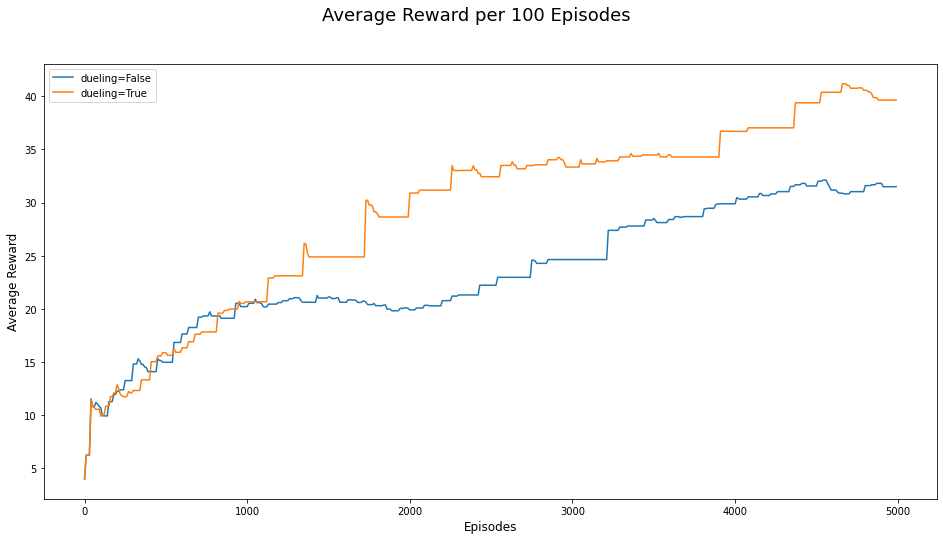

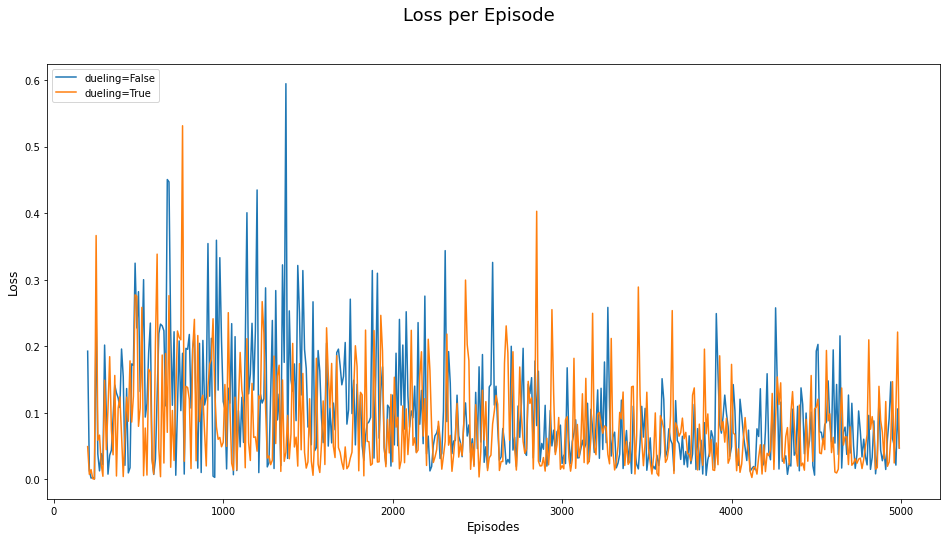

In [ ]:
experiment(dueling, 'dueling')

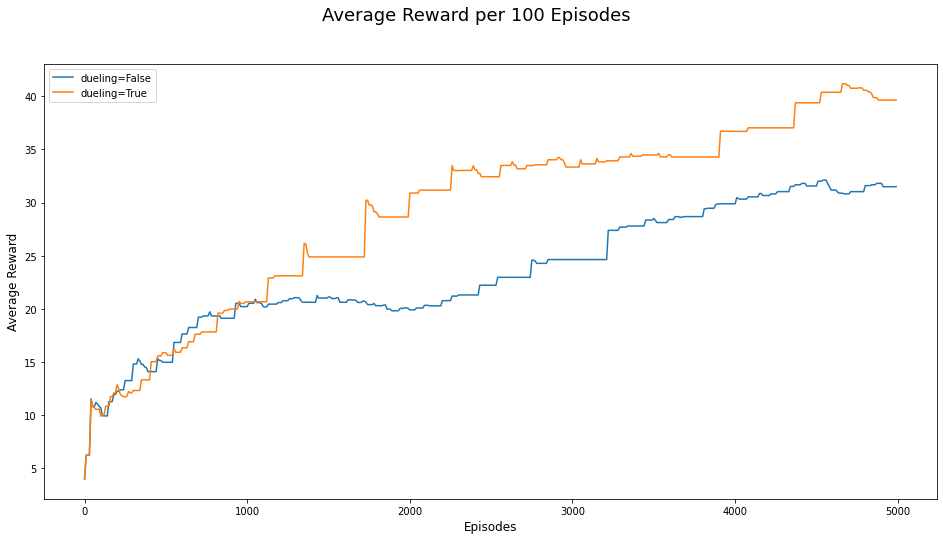

INFO 2022-07-26 09:06:59,815 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning atom_num: ##########

set value to: 51
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:07:01,669 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:07:01,671 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 27
INFO 2022-07-26 09:07:01,676 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:07:01,681 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:07:03,534 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:07:03,535 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 26
INFO 2022-07-26 09:07:03,540 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.571429
INFO 2022-07-26 09:07:03,549 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.523879
INFO 2022-07-26 09:07:04,733 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 33.50130702752177
num of avg steps before done in the last 100 episodes: 42.1



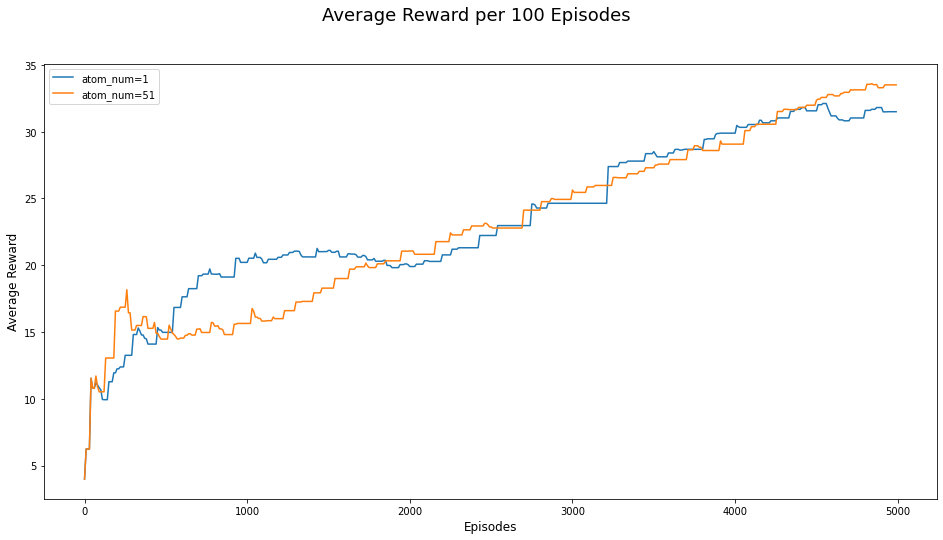

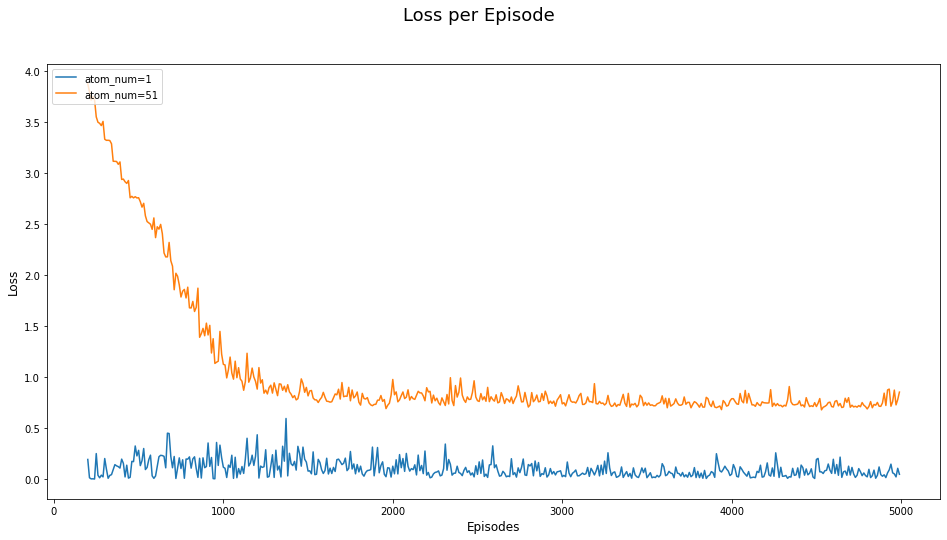

In [ ]:
experiment(atom_num, 'atom_num')

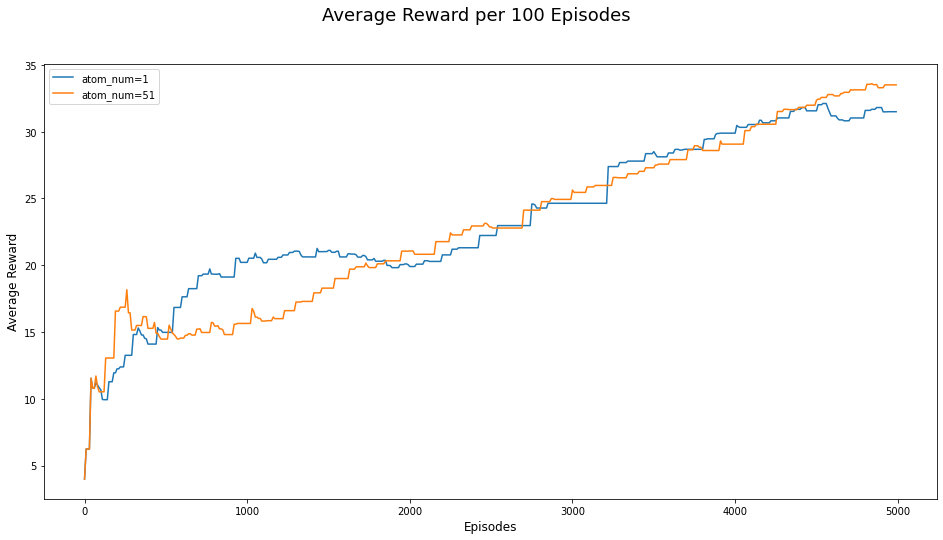

### hyperparameters experiments

In [ ]:
# Hyperparameters Tuning 
buffer_size = [5000, 10000]
exploration_fraction = [0.1, 0.3]
exploration_final_eps = [0.01, 0.025]
target_network_update_freq =[100, 250]
gamma = [0.9, 0.95]
lr = [1e-4, 1e-5]

INFO 2022-07-26 09:09:48,035 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning buffer_size: ##########

set value to: 5000
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:09:49,892 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:09:49,894 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 27
INFO 2022-07-26 09:09:49,899 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:09:49,903 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:09:51,750 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:09:51,751 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 26
INFO 2022-07-26 09:09:51,756 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:09:51,760 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:09:53,386 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 33.14187793216731
num of avg steps before done in the last 100 episodes: 41.42



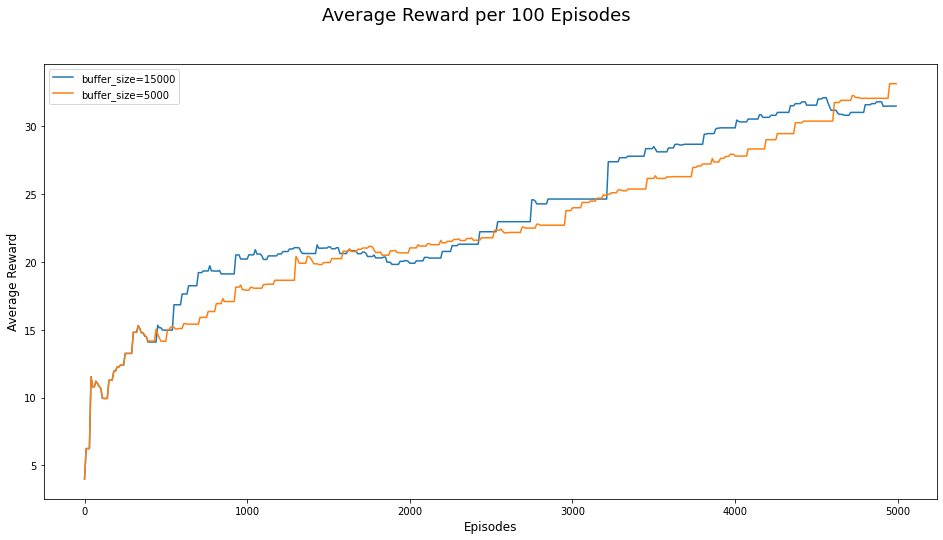

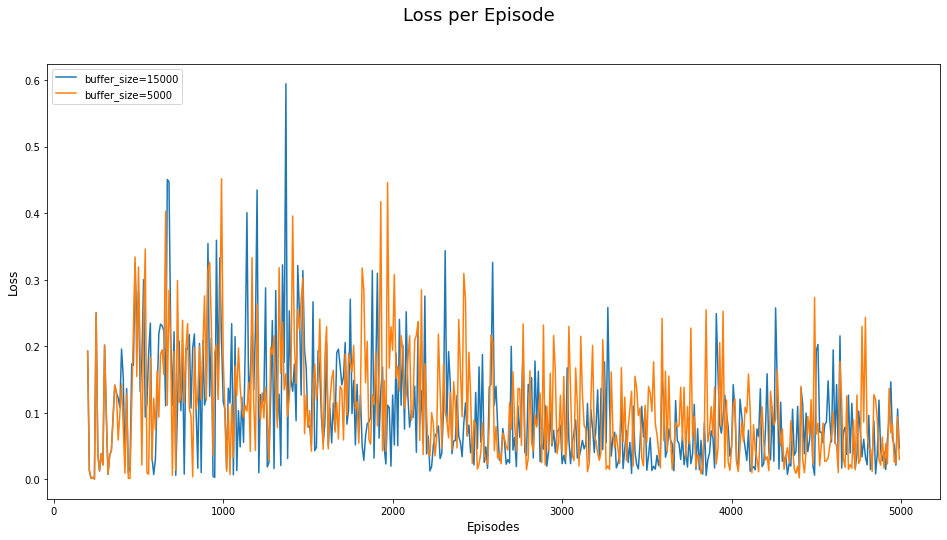

INFO 2022-07-26 09:12:34,838 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----

set value to: 10000
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:12:36,698 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:12:36,700 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 26
INFO 2022-07-26 09:12:36,709 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:12:36,710 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:12:38,568 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:12:38,569 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 26
INFO 2022-07-26 09:12:38,579 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:12:38,583 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:12:40,206 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 33.416208754407016
num of avg steps before done in the last 100 episodes: 41.78



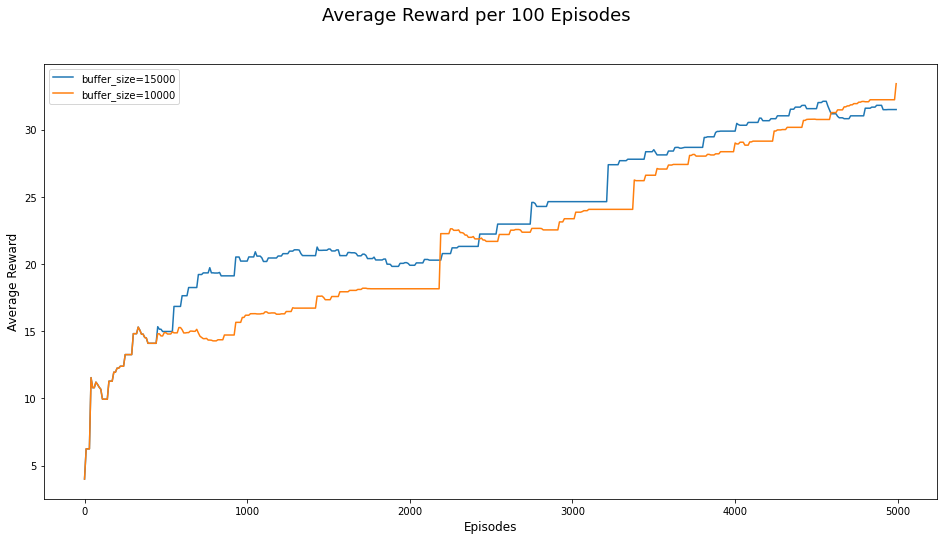

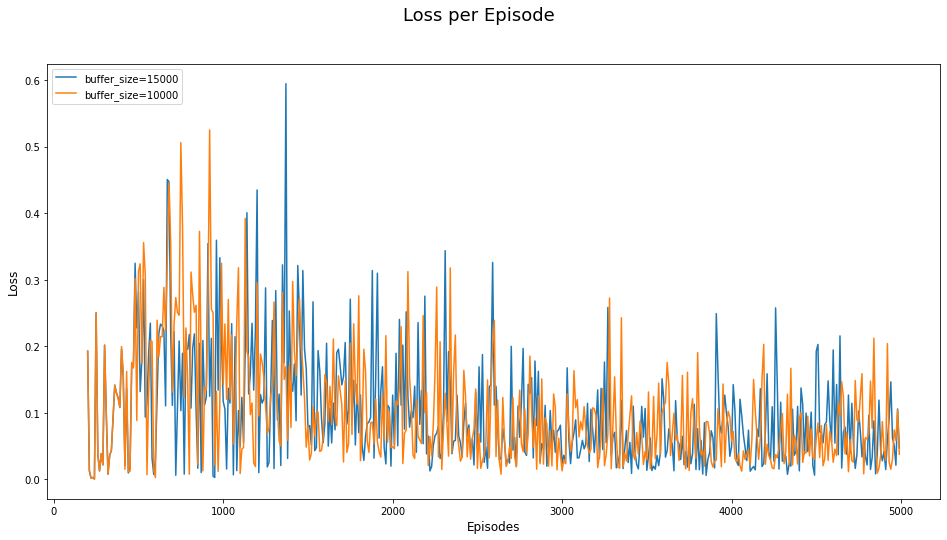

In [ ]:
experiment(buffer_size, 'buffer_size')

INFO 2022-07-26 09:15:23,089 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning exploration_fraction: ##########

set value to: 0.1
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:15:24,719 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:15:24,721 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 30
INFO 2022-07-26 09:15:24,725 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 7.500000
INFO 2022-07-26 09:15:24,729 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 6.240174
INFO 2022-07-26 09:15:26,352 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:15:26,354 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 30
INFO 2022-07-26 09:15:26,359 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 19.600000
INFO 2022-07-26 09:15:26,364 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 14.919603
INFO 2022-07-26 09:15:28,005 MainProcess 72| <ipython-input-9-d5229f28c240> 


num of avg rewards before done in the last 100 episodes: 29.686592581122166
num of avg steps before done in the last 100 episodes: 37.21



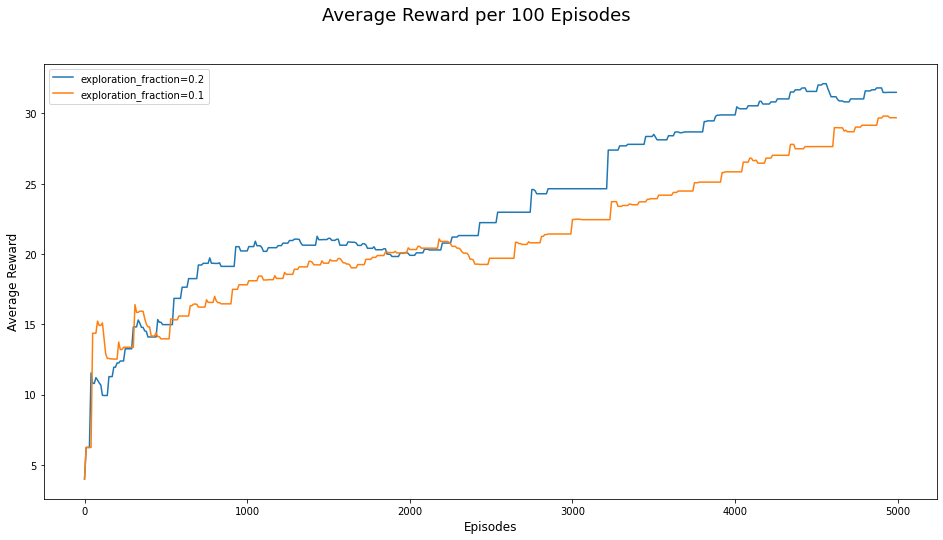

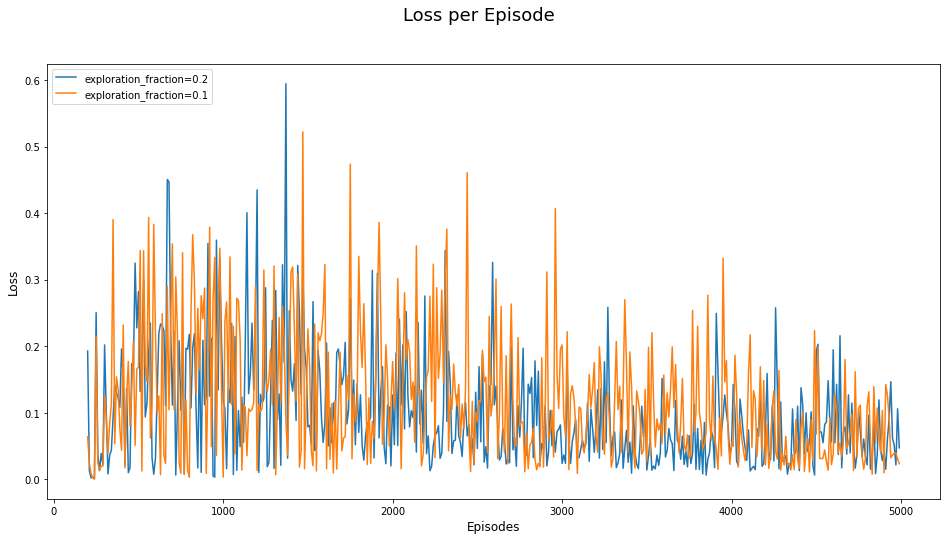

INFO 2022-07-26 09:18:12,236 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----

set value to: 0.3
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:18:14,109 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:18:14,110 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 26
INFO 2022-07-26 09:18:14,116 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:18:14,120 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:18:15,948 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:18:15,950 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 27
INFO 2022-07-26 09:18:15,959 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:18:15,961 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:18:17,596 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 31.467343500877636
num of avg steps before done in the last 100 episodes: 38.63



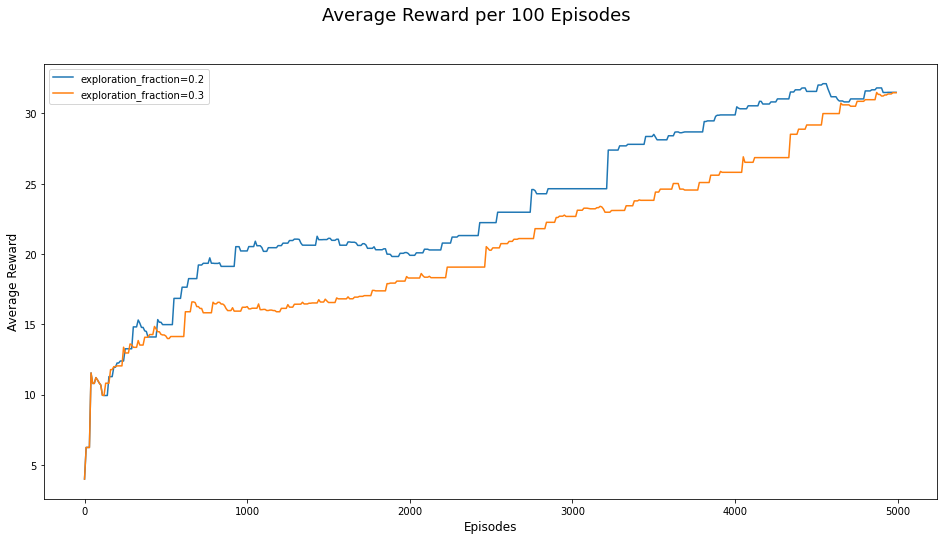

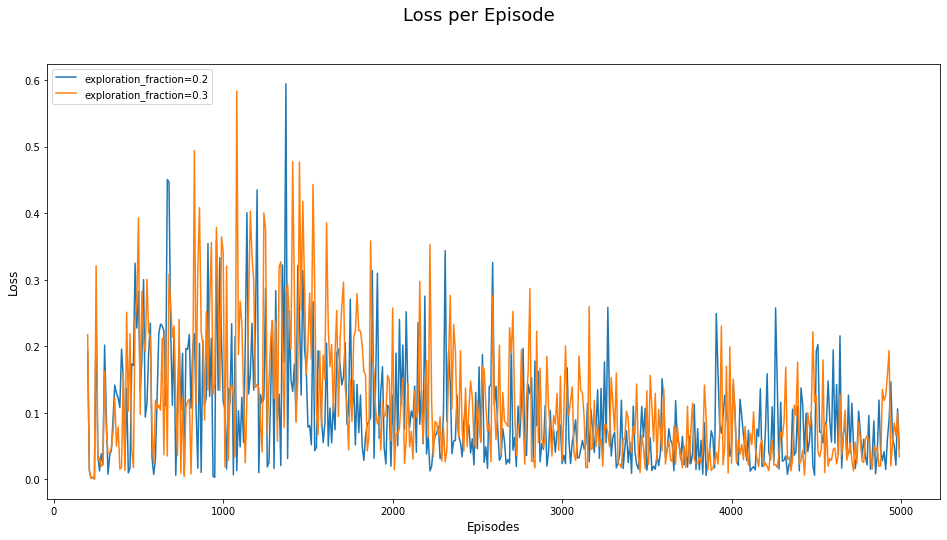

In [ ]:
experiment(exploration_fraction, 'exploration_fraction')

INFO 2022-07-26 09:21:02,602 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning exploration_final_eps: ##########

set value to: 0.01
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:21:04,452 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:21:04,454 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 27
INFO 2022-07-26 09:21:04,459 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:21:04,463 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:21:06,297 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:21:06,298 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 27
INFO 2022-07-26 09:21:06,306 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:21:06,309 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:21:07,918 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 35.44195602781517
num of avg steps before done in the last 100 episodes: 43.83



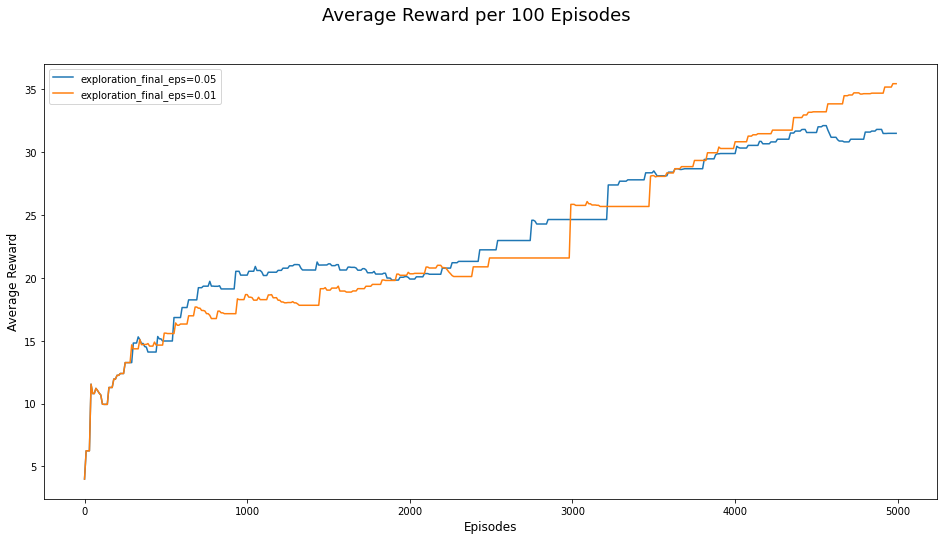

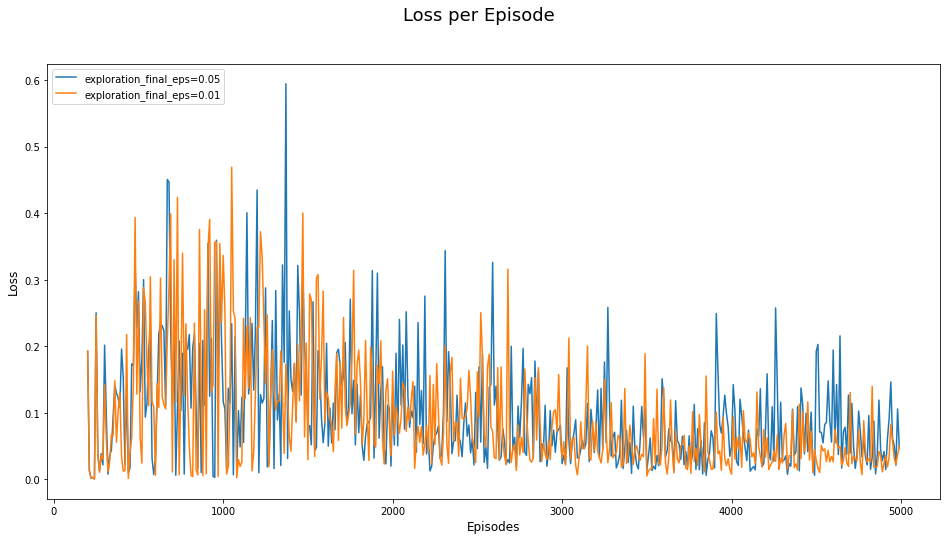

INFO 2022-07-26 09:23:46,523 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----

set value to: 0.025
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:23:48,366 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:23:48,368 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 27
INFO 2022-07-26 09:23:48,377 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:23:48,378 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:23:50,231 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:23:50,233 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 27
INFO 2022-07-26 09:23:50,236 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:23:50,241 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:23:51,865 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 27.838422545126182
num of avg steps before done in the last 100 episodes: 34.98



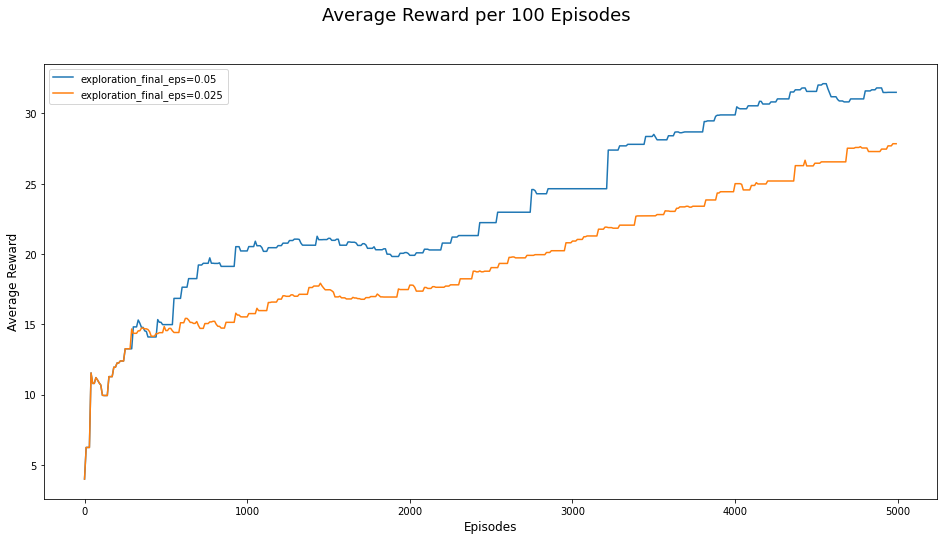

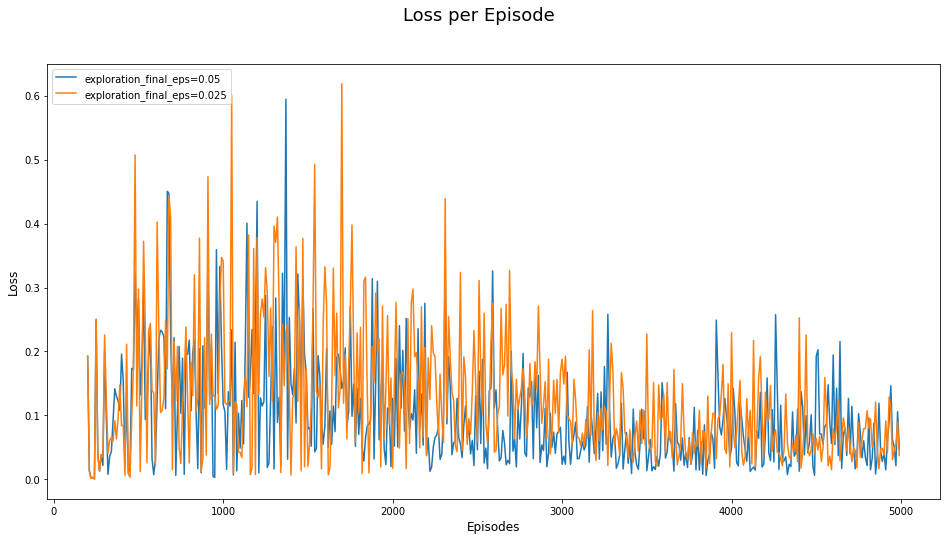

In [ ]:
experiment(exploration_final_eps, 'exploration_final_eps')

INFO 2022-07-26 09:29:27,223 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning target_network_update_freq: ##########

set value to: 100
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:29:30,809 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:29:30,811 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 27
INFO 2022-07-26 09:29:30,815 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:29:30,819 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:29:33,849 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 09:29:33,856 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 200 FPS 30
INFO 2022-07-26 09:29:33,857 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.416667
INFO 2022-07-26 09:29:33,861 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.944881
INFO 2022-07-26 09:29:37,409 MainProcess 72| <ipython-input-9-d5229f28c2


num of avg rewards before done in the last 100 episodes: 34.20808629752756
num of avg steps before done in the last 100 episodes: 42.85



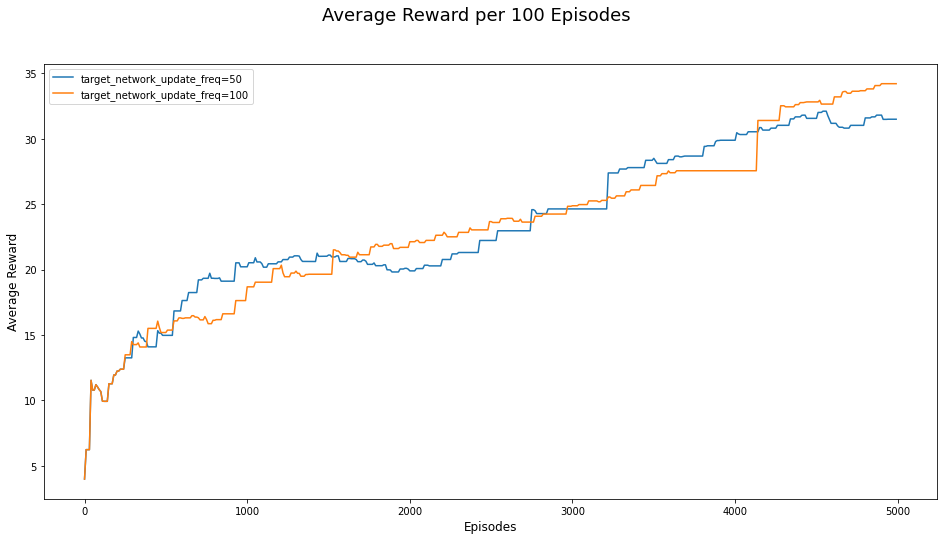

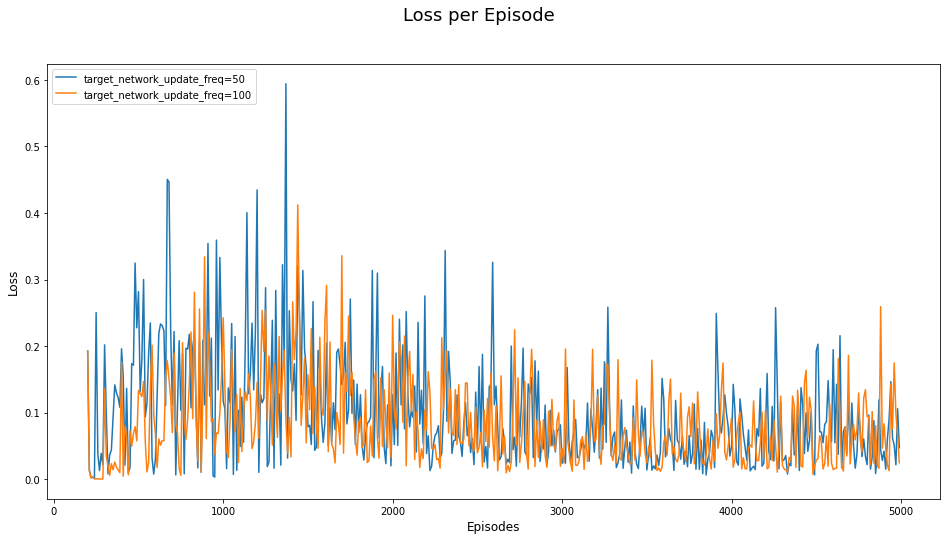

INFO 2022-07-26 09:32:10,248 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----

set value to: 250
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:32:18,669 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 250 ==========
INFO 2022-07-26 09:32:18,671 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 250 FPS 29
INFO 2022-07-26 09:32:18,678 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.928571
INFO 2022-07-26 09:32:18,683 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 12.388151
INFO 2022-07-26 09:32:18,684 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:114] | vloss: 0.000561
INFO 2022-07-26 09:32:27,934 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 500 ==========
INFO 2022-07-26 09:32:27,936 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 500 FPS 28
INFO 2022-07-26 09:32:27,945 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 18.153846
INFO 2022-07-26 09:32:27,949 MainProcess 72| <ipython-input-9-d5229f28c240> |


num of avg rewards before done in the last 100 episodes: 28.566844119309426
num of avg steps before done in the last 100 episodes: 35.55



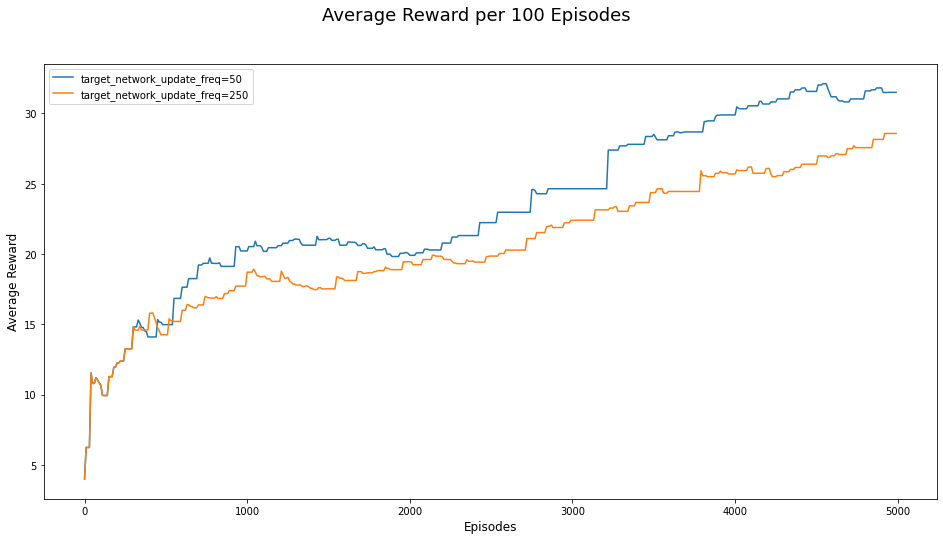

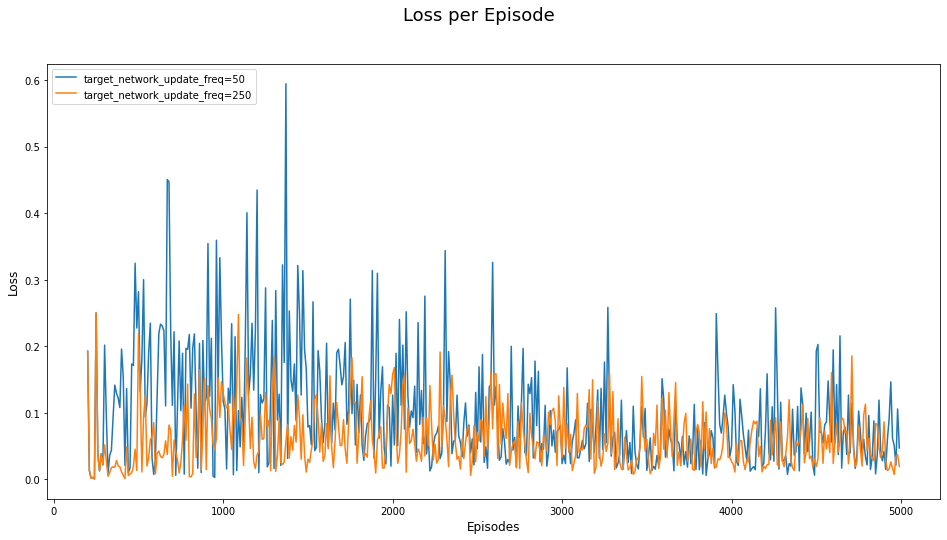

In [ ]:
experiment(target_network_update_freq, 'target_network_update_freq')

INFO 2022-07-26 09:37:44,672 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning gamma: ##########

set value to: 0.9
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:37:46,565 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:37:46,567 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 26
INFO 2022-07-26 09:37:46,572 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:37:46,576 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:37:48,419 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:37:48,421 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 26
INFO 2022-07-26 09:37:48,425 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:37:48,428 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:37:50,046 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 32.787145488958124
num of avg steps before done in the last 100 episodes: 40.54



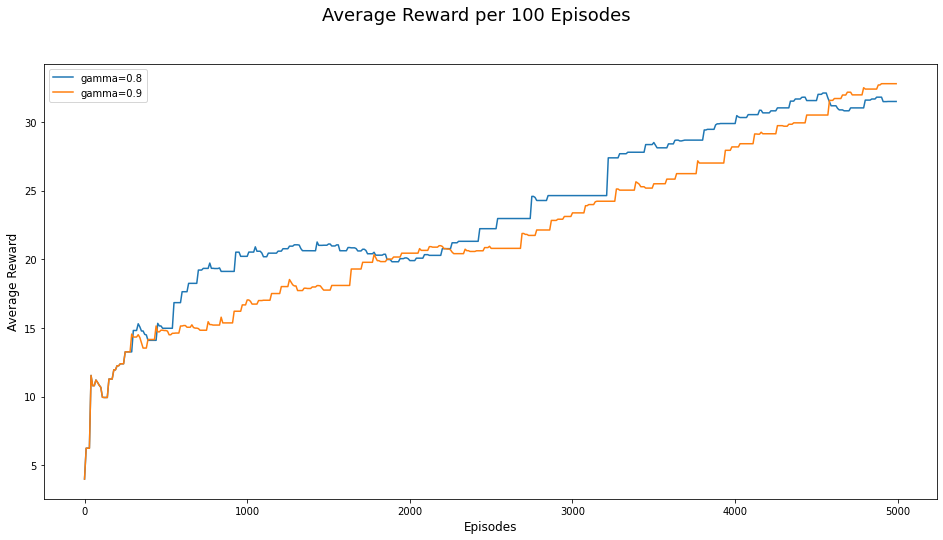

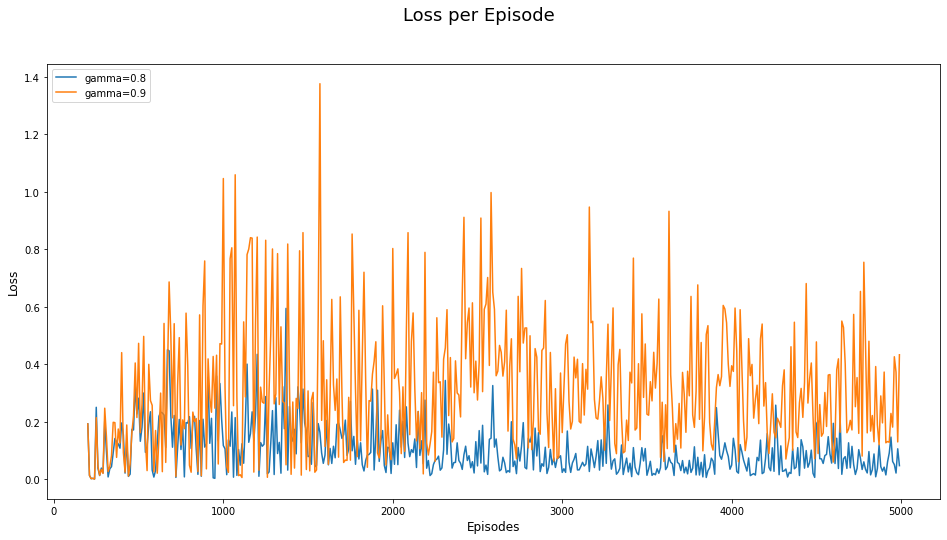

INFO 2022-07-26 09:40:32,857 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----

set value to: 0.95
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:40:34,714 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:40:34,716 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 26
INFO 2022-07-26 09:40:34,722 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:40:34,727 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:40:36,574 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:40:36,575 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 26
INFO 2022-07-26 09:40:36,583 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:40:36,585 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:40:38,224 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 27.866936319621992
num of avg steps before done in the last 100 episodes: 34.26



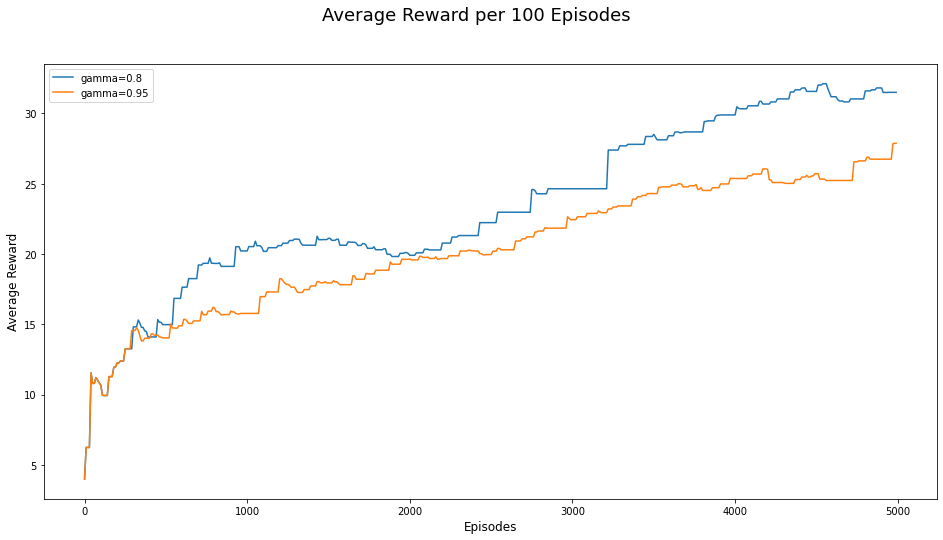

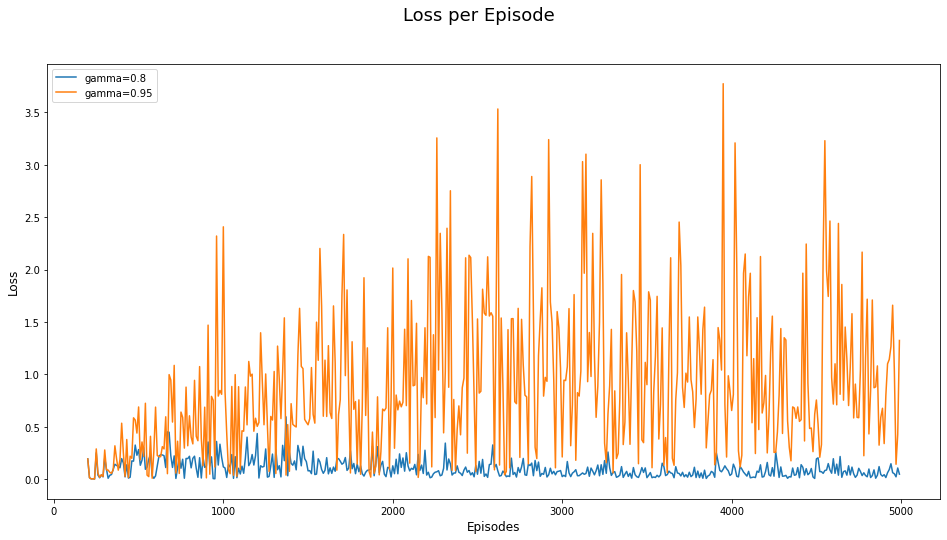

In [ ]:
experiment(gamma, 'gamma')

INFO 2022-07-26 09:43:26,032 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----


########## tuning lr: ##########

set value to: 0.0001
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:43:28,008 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:43:28,015 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 25
INFO 2022-07-26 09:43:28,021 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:43:28,023 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:43:29,975 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:43:29,978 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 25
INFO 2022-07-26 09:43:29,981 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:43:29,984 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:43:31,627 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 26.064563851091943
num of avg steps before done in the last 100 episodes: 32.84



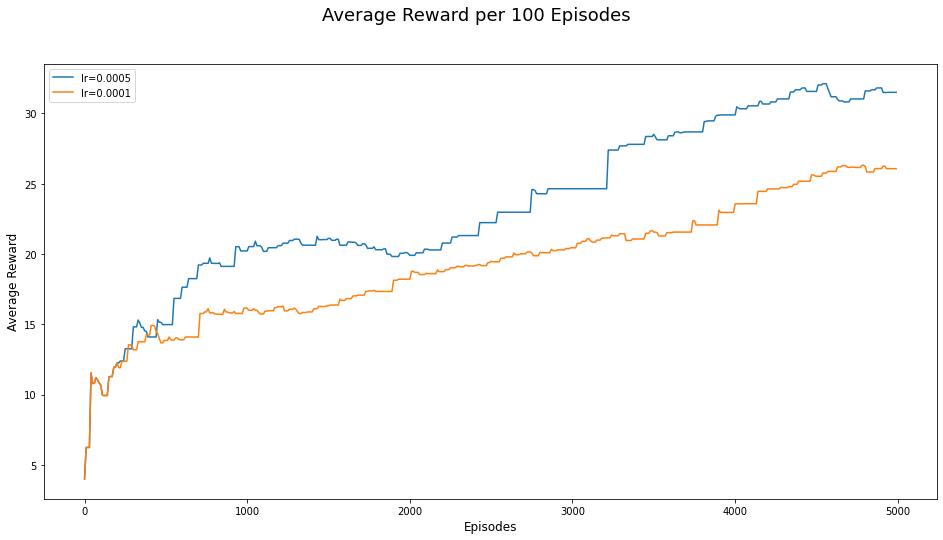

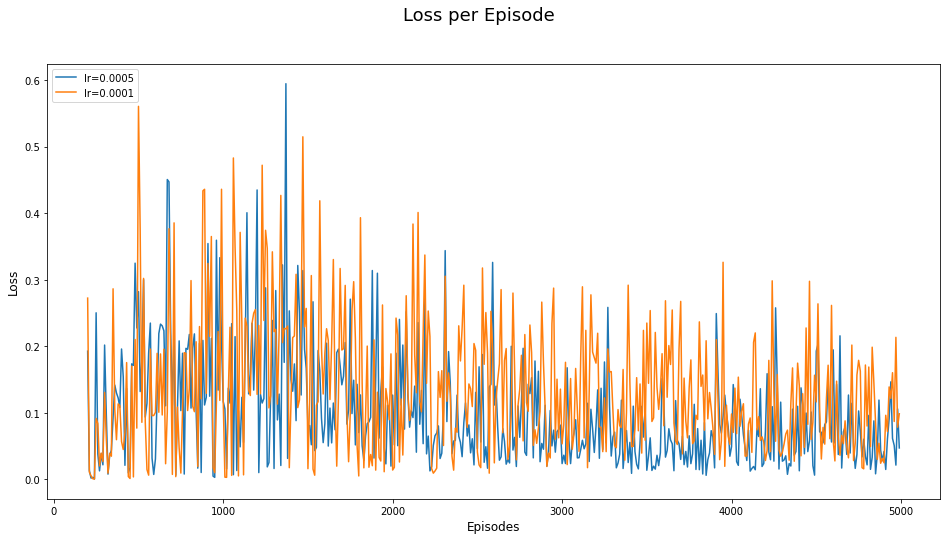

INFO 2022-07-26 09:46:20,911 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----

set value to: 1e-05
{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:46:22,759 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 50 ==========
INFO 2022-07-26 09:46:22,761 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 50 FPS 27
INFO 2022-07-26 09:46:22,770 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 15.000000
INFO 2022-07-26 09:46:22,772 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 11.541243
INFO 2022-07-26 09:46:24,615 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:46:24,617 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 27
INFO 2022-07-26 09:46:24,623 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 13.857143
INFO 2022-07-26 09:46:24,626 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 10.829948
INFO 2022-07-26 09:46:26,260 MainProcess 72| <ipython-input-9-d5229f28c240


num of avg rewards before done in the last 100 episodes: 24.454323256933336
num of avg steps before done in the last 100 episodes: 30.86



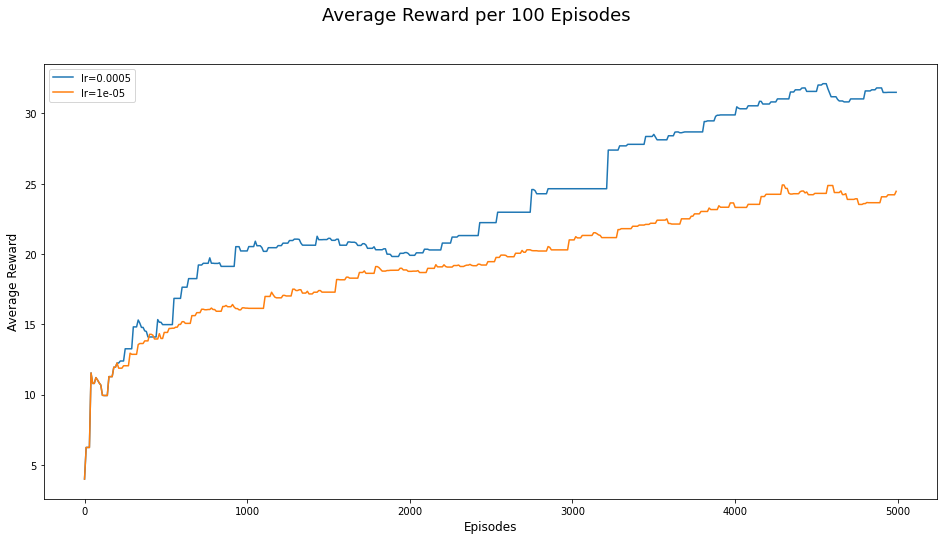

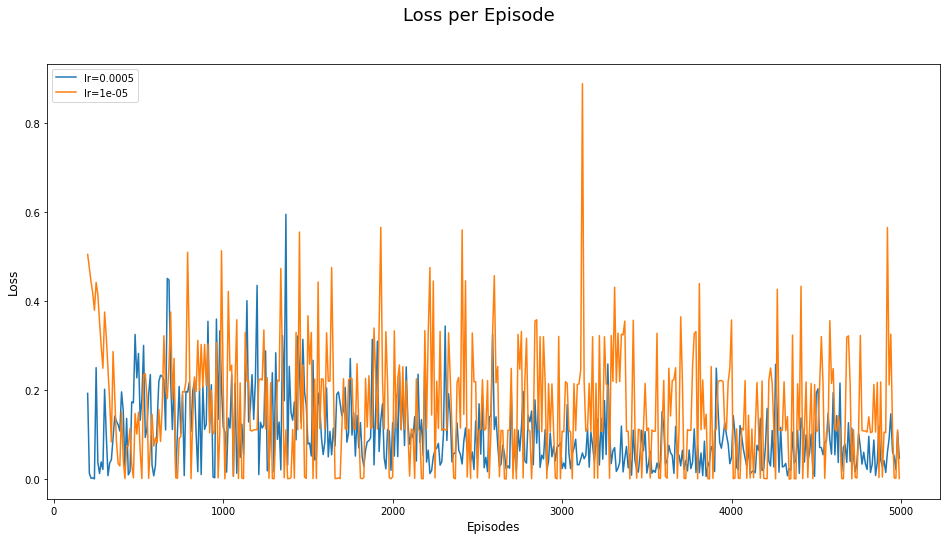

In [ ]:
experiment(lr, 'lr')

### retrain with best params

INFO 2022-07-26 09:52:43,217 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-----

{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:52:46,498 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:52:46,500 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 30
INFO 2022-07-26 09:52:46,504 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 16.200000
INFO 2022-07-26 09:52:46,507 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 12.391450
INFO 2022-07-26 09:52:49,375 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 09:52:49,377 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 200 FPS 32
INFO 2022-07-26 09:52:49,382 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 20.444444
INFO 2022-07-26 09:52:49,385 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 15.798912
INFO 2022-07-26 09:52:53,437 MainProcess 72| <ipython-input-9-d5229f28c2

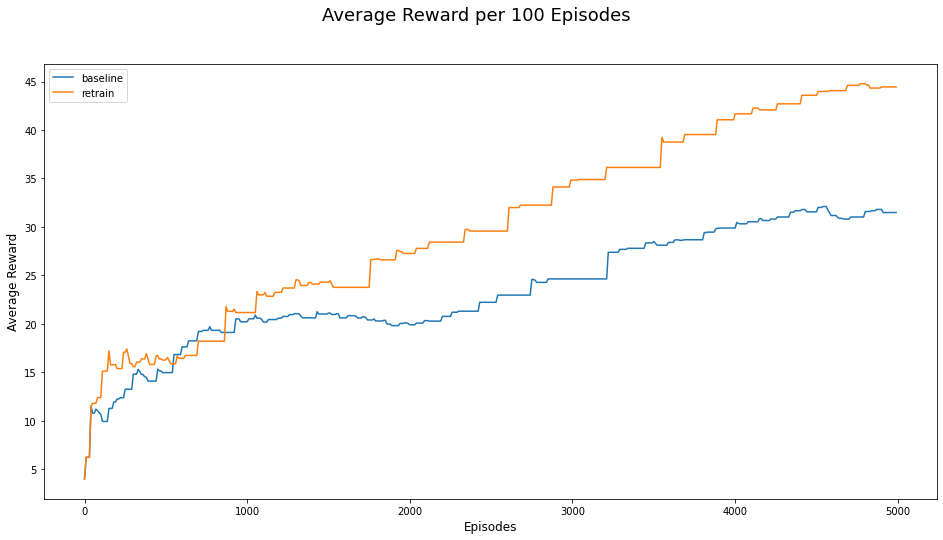

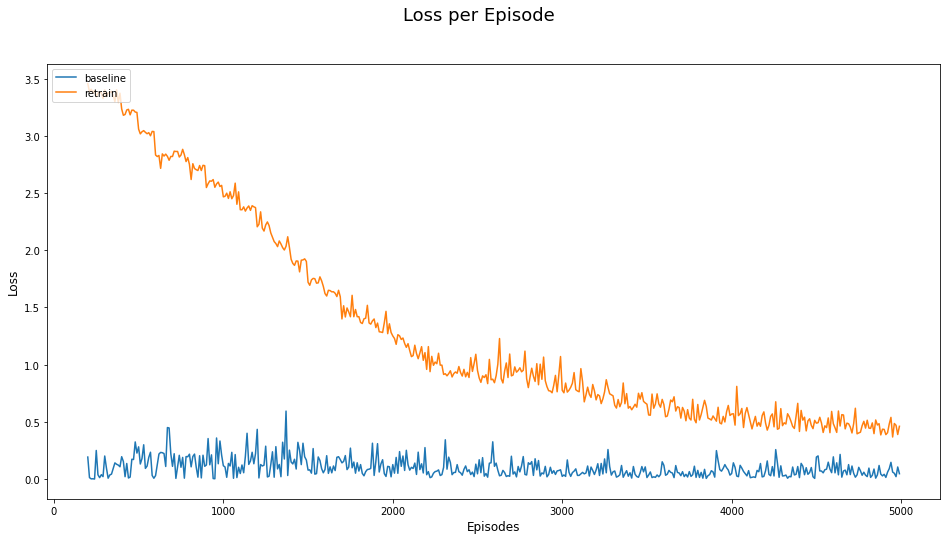

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs',
    logger=init_logger('logs'),
    env_id='highway-fast-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(5e3),
    reward_scale=1.0,
    save_path='checkpoints',
    save_interval=int(1e3),
    config_file='config_ex1.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=10000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )

def main():
    if not os.path.isdir('checkpoints'):
        os.mkdir('checkpoints')  
    return run(**train_kwargs)
    
retrain_rewards, retrain_steps, retrain_losses = main()
plot_results([baseline_rewards, retrain_rewards], [baseline_losses, retrain_losses], ['baseline', 'retrain'])

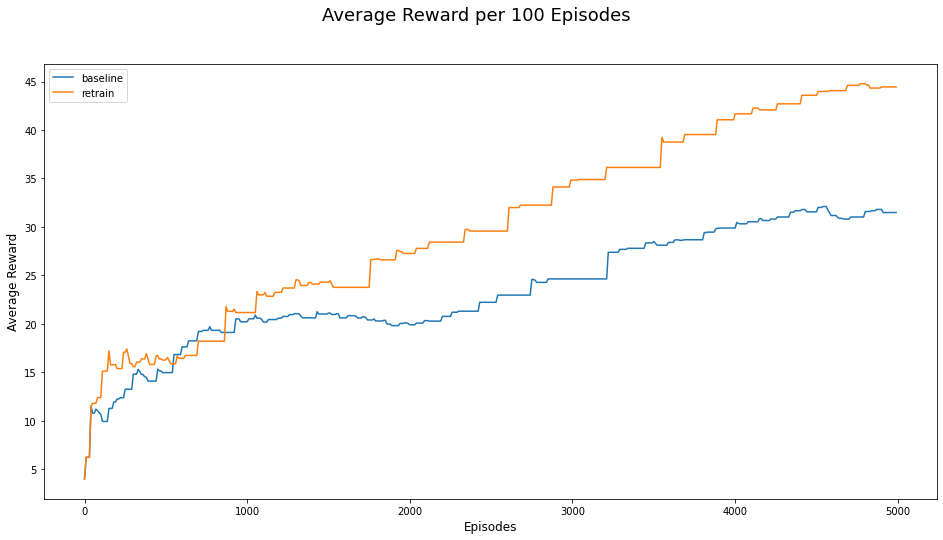

retrain with best params - 20K iterations

INFO 2022-07-26 09:57:23,800 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs (INFO)>
------------------------------------------------------------
number_timesteps: 20000
------------------------------------------------------------
save_path: 'checkpoints'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex1.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
----

{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 09:57:27,131 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 09:57:27,132 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 30
INFO 2022-07-26 09:57:27,136 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 16.200000
INFO 2022-07-26 09:57:27,139 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 12.391450
INFO 2022-07-26 09:57:29,802 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 09:57:29,804 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 200 FPS 33
INFO 2022-07-26 09:57:29,810 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 22.375000
INFO 2022-07-26 09:57:29,812 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 17.283238
INFO 2022-07-26 09:57:33,626 MainProcess 72| <ipython-input-9-d5229f28c2

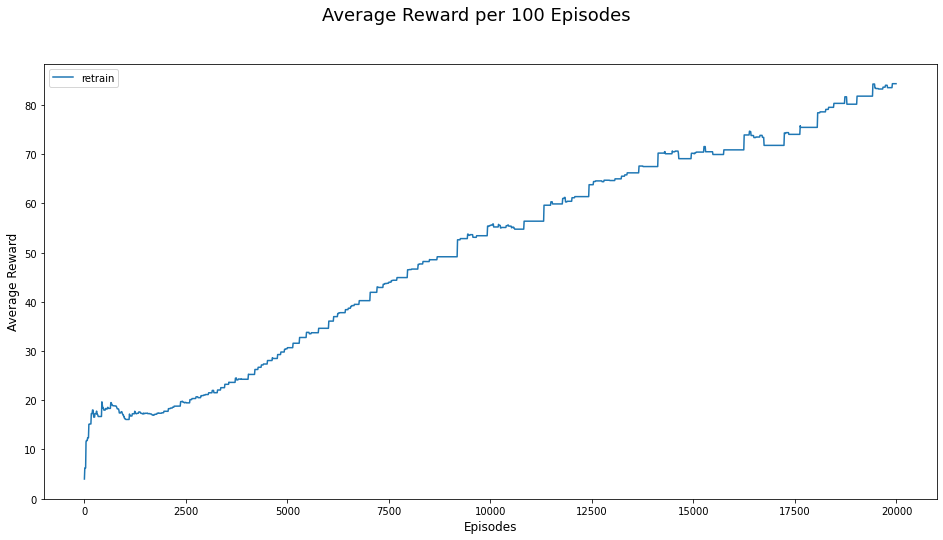

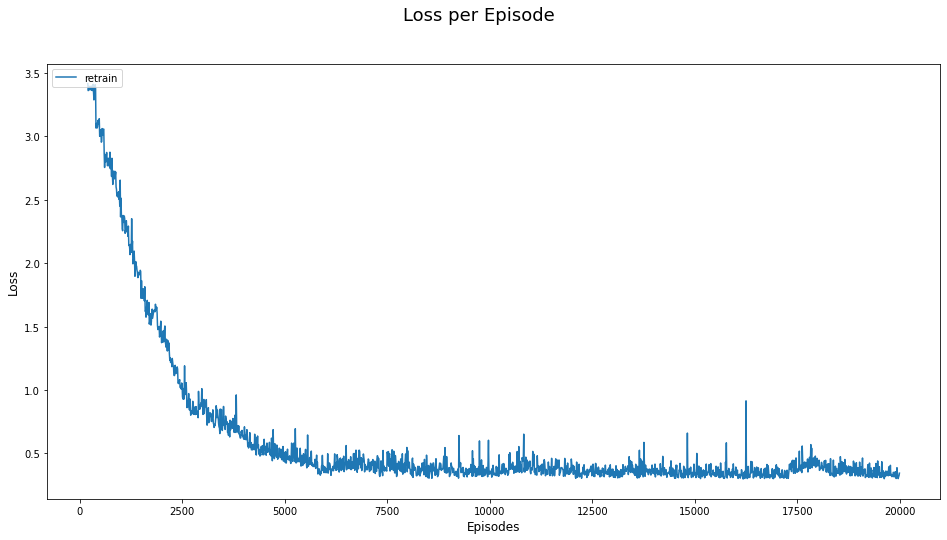

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs',
    logger=init_logger('logs'),
    env_id='highway-fast-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(2e4),
    reward_scale=1.0,
    save_path='checkpoints',
    save_interval=int(1e3),
    config_file='config_ex1.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=10000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )

def main():
    if not os.path.isdir('checkpoints'):
        os.mkdir('checkpoints')  
    return run(**train_kwargs)
    
retrain_rewards, retrain_steps, retrain_losses = main()
plot_results([retrain_rewards], [retrain_losses], ['retrain'])

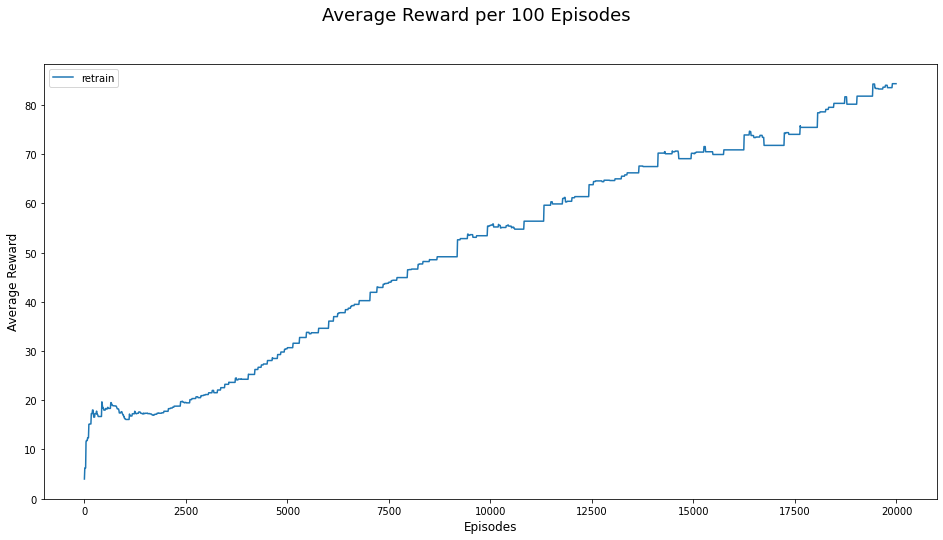

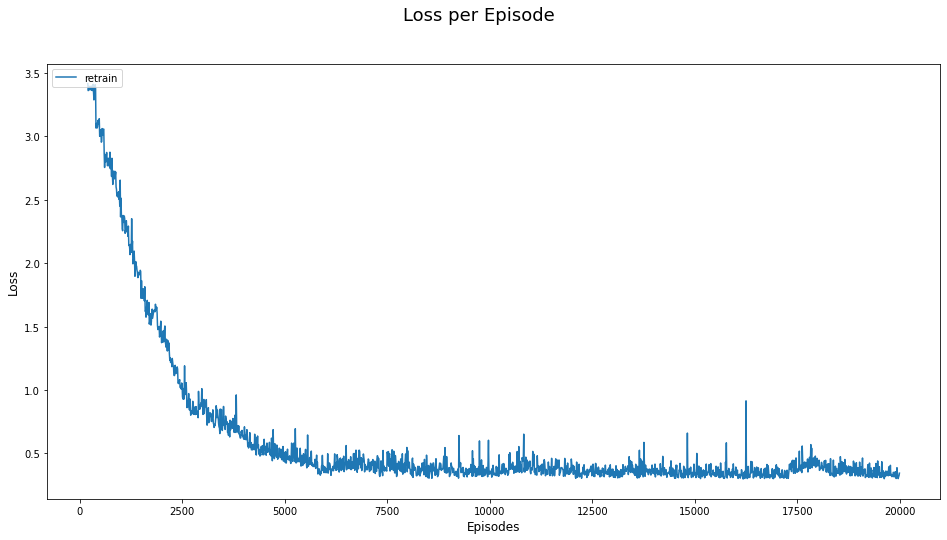

test with best params

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints/20000.checkpoint',
    log_path='logs',
    config_file='config_ex1.txt',
    stochastic_env=False,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='highway-fast-v0',
    env_type='atari',
    seed=11,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

test(**test_kwargs)
show_video()

{'observation': {'vehicles_count': 20, 'vehicles_density': 3, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}

eplenmean is: 500
eprewmean is: 364.7



## **Ex2 - Highway-Env - Grayscale Image - Medium**



### train

INFO 2022-07-26 10:15:51,915 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_2 (INFO)>
------------------------------------------------------------
number_timesteps: 20000
------------------------------------------------------------
save_path: 'checkpoints_2'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex2.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32


{'observation': {'vehicles_count': 150, 'vehicles_density': 75, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.AggressiveVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 6, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False, 'initial_vehicle_count': 30}


INFO 2022-07-26 10:15:55,976 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 10:15:55,979 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 24
INFO 2022-07-26 10:15:55,984 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 24.000000
INFO 2022-07-26 10:15:55,988 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 18.892351
INFO 2022-07-26 10:15:59,925 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 10:15:59,926 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 200 FPS 25
INFO 2022-07-26 10:15:59,930 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 19.600000
INFO 2022-07-26 10:15:59,933 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 14.963493
INFO 2022-07-26 10:16:04,057 MainProcess 72| <ipython-input-9-d5229f28c2

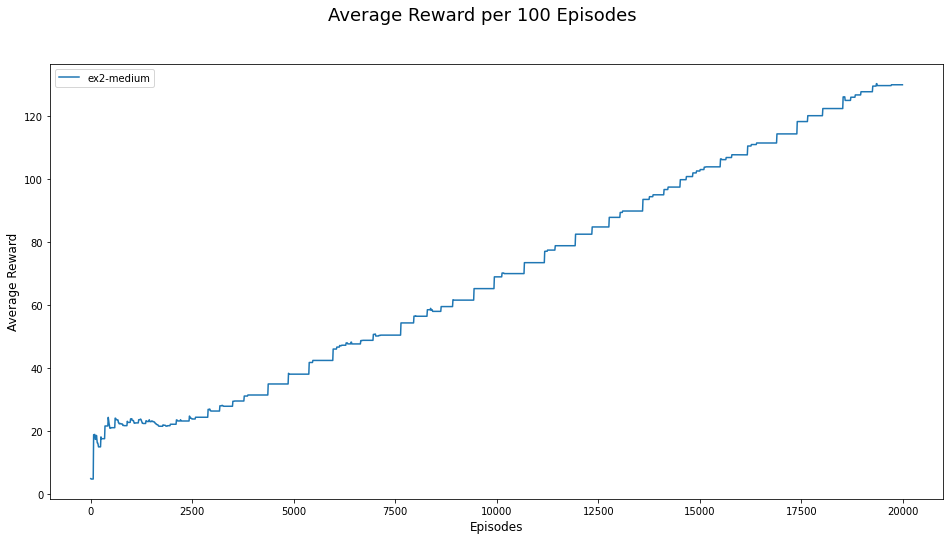

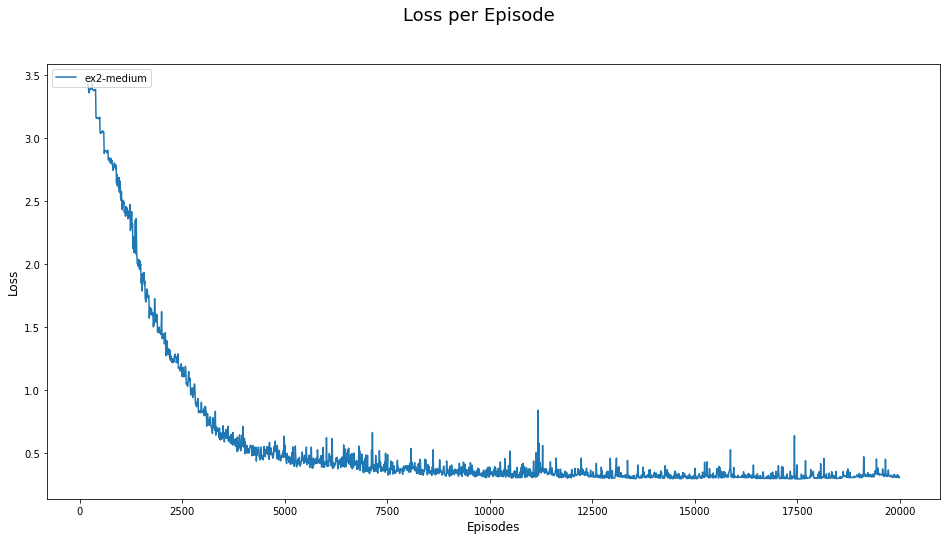

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs_2',
    logger=init_logger('logs_2'),
    env_id='highway-fast-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(2e4),
    reward_scale=1.0,
    save_path='checkpoints_2',
    save_interval=int(1e3),
    config_file='config_ex2.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=10000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )

def main():
    if not os.path.isdir('checkpoints_2'):
        os.mkdir('checkpoints_2')  
    return run(**train_kwargs)
    
rewards, steps, losses = main()
plot_results([rewards], [losses], ['ex2-medium'])

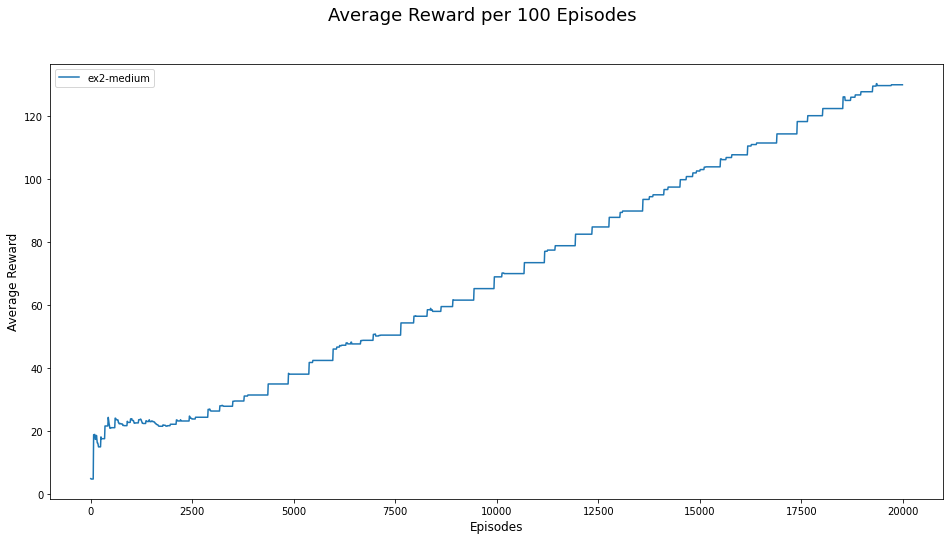

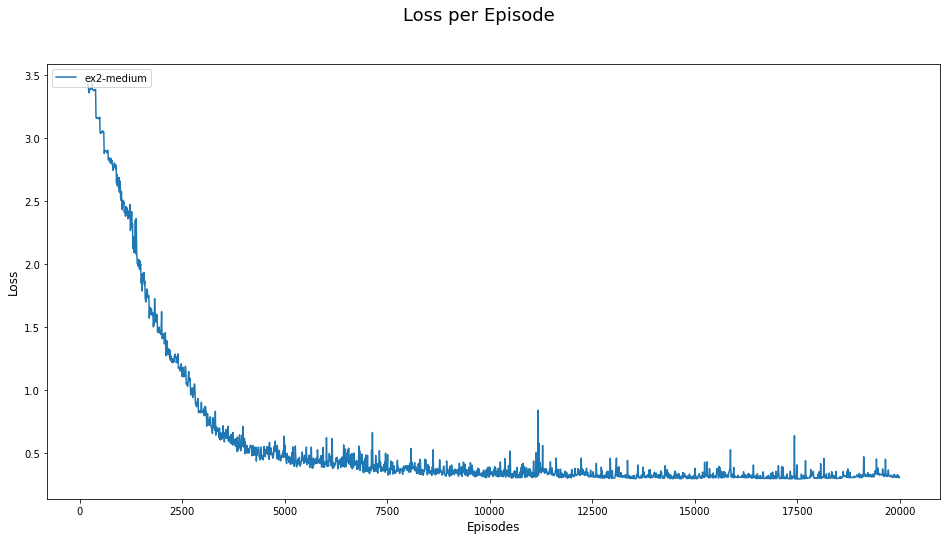

## test

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints_2/20000.checkpoint',
    log_path='logs_2',
    config_file='config_ex2.txt',
    stochastic_env=False,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='highway-fast-v0',
    env_type='atari',
    seed=3,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

test(**test_kwargs)
show_video()

{'observation': {'vehicles_count': 150, 'vehicles_density': 75, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.AggressiveVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 6, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False, 'initial_vehicle_count': 30}

eplenmean is: 500
eprewmean is: 375.47



# **Ex3 - Highway-Env**

### train

INFO 2022-07-26 10:31:49,842 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_3 (INFO)>
------------------------------------------------------------
number_timesteps: 20000
------------------------------------------------------------
save_path: 'checkpoints_3'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex3.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 10:31:53,196 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 10:31:53,197 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 29
INFO 2022-07-26 10:31:53,201 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 16.200000
INFO 2022-07-26 10:31:53,204 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 12.391450
INFO 2022-07-26 10:31:55,827 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 10:31:55,829 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 200 FPS 33
INFO 2022-07-26 10:31:55,833 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 22.375000
INFO 2022-07-26 10:31:55,838 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 17.283238
INFO 2022-07-26 10:31:59,679 MainProcess 72| <ipython-input-9-d5229f28c2

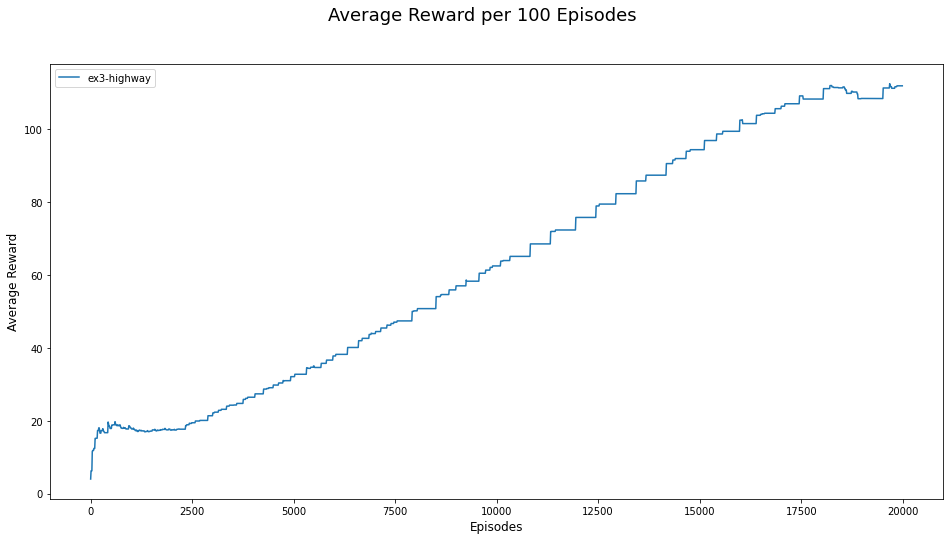

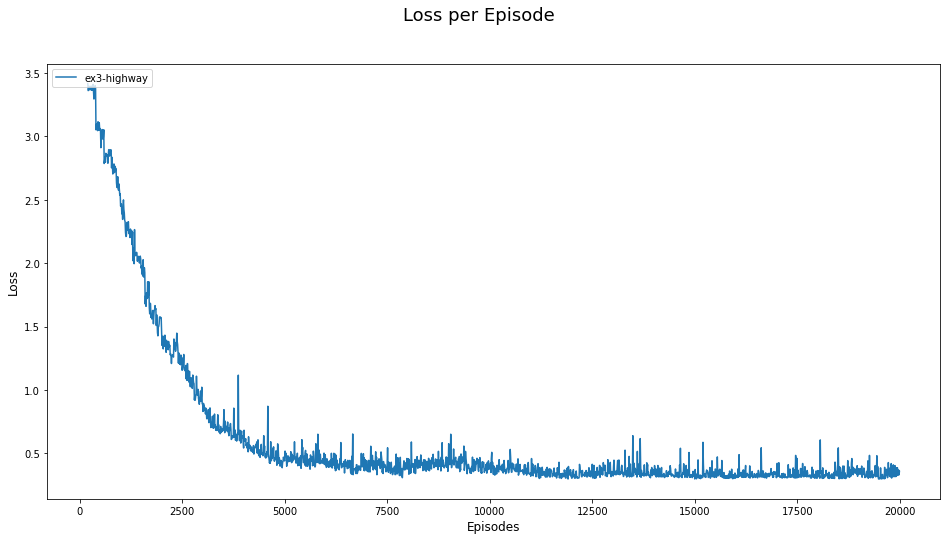

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs_3',
    logger=init_logger('logs_3'),
    env_id='highway-fast-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(2e4),
    reward_scale=1.0,
    save_path='checkpoints_3',
    save_interval=int(1e3),
    config_file='config_ex3.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=10000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )

def main():
    if not os.path.isdir('checkpoints_3'):
        os.mkdir('checkpoints_3')  
    return run(**train_kwargs)
    
rewards, steps, losses = main()
plot_results([rewards], [losses], ['ex3-highway'])

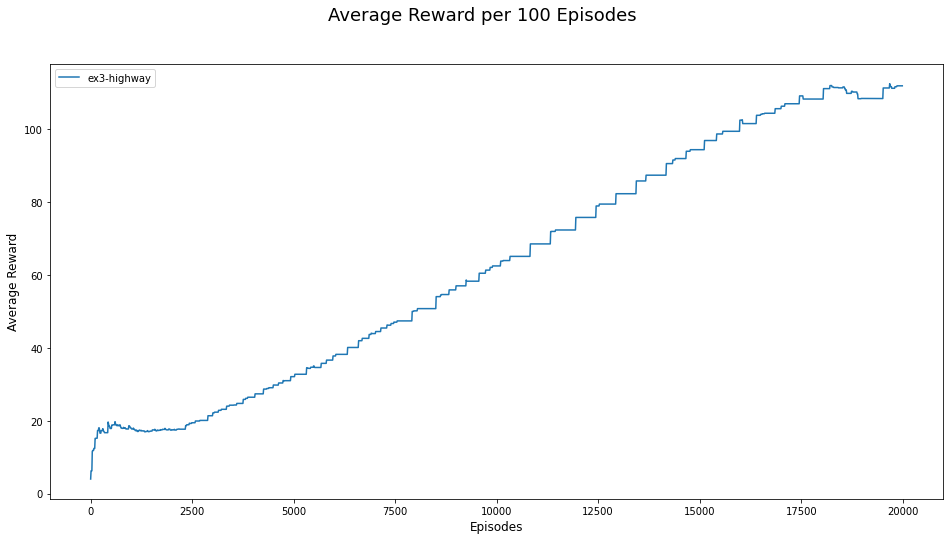

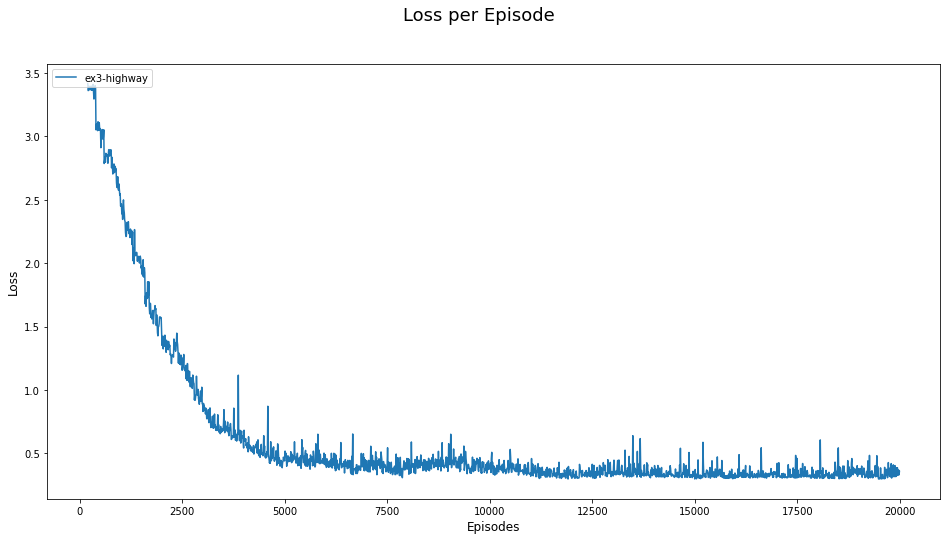

### test

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints_3/20000.checkpoint',
    log_path='logs_3',
    config_file='config_ex3.txt',
    stochastic_env=False,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='highway-fast-v0',
    env_type='atari',
    seed=16,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

test(**test_kwargs)
show_video()

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}

eplenmean is: 500
eprewmean is: 371.14



# **Ex3 - Merge-Env**

### train

INFO 2022-07-26 10:54:12,864 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<MergeEnv<merge-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_4 (INFO)>
------------------------------------------------------------
number_timesteps: 20000
------------------------------------------------------------
save_path: 'checkpoints_4'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex3.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
-------------

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.2, 'merging_speed_reward': -0.5, 'lane_change_reward': -0.05, 'duration': 500}


INFO 2022-07-26 10:54:15,268 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 10:54:15,269 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 41
INFO 2022-07-26 10:54:15,276 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 30.000000
INFO 2022-07-26 10:54:15,279 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 25.474165
INFO 2022-07-26 10:54:17,719 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 10:54:17,721 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 200 FPS 41
INFO 2022-07-26 10:54:17,725 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 27.428571
INFO 2022-07-26 10:54:17,728 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 23.436419
INFO 2022-07-26 10:54:21,224 MainProcess 72| <ipython-input-9-d5229f28c2

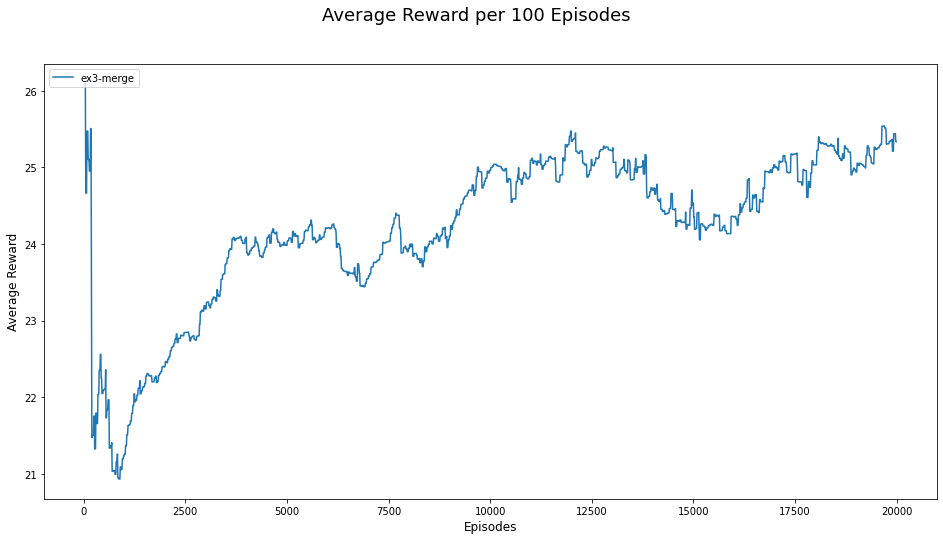

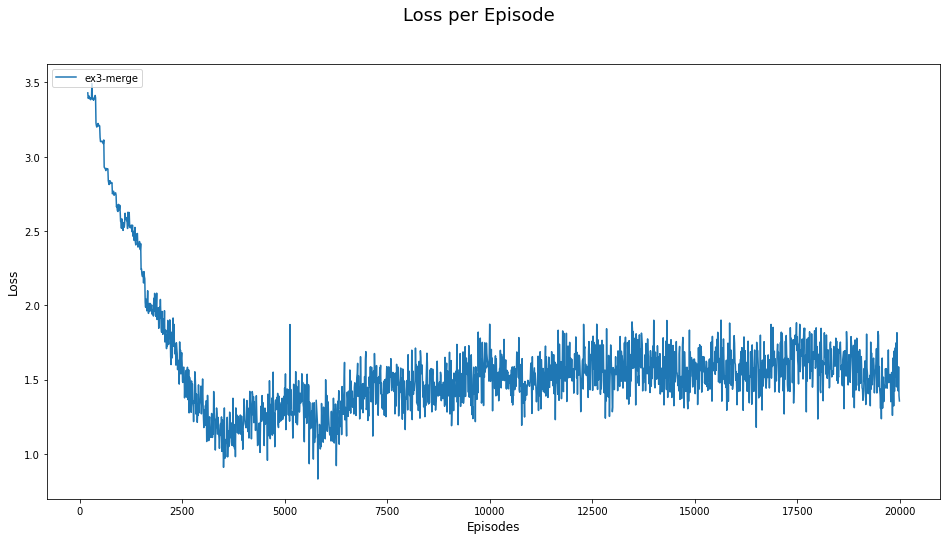

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs_4',
    logger=init_logger('logs_4'),
    env_id='merge-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(2e4),
    reward_scale=1.0,
    save_path='checkpoints_4',
    save_interval=int(1e3),
    config_file='config_ex3.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=10000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )

def main():
    if not os.path.isdir('checkpoints_4'):
        os.mkdir('checkpoints_4')  
    return run(**train_kwargs)
    
rewards, steps, losses = main()
plot_results([rewards], [losses], ['ex3-merge'])

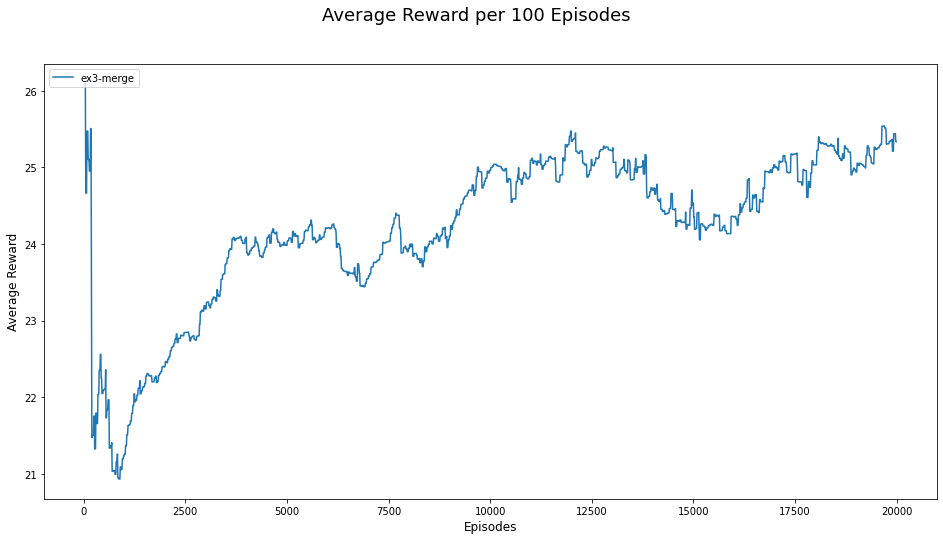

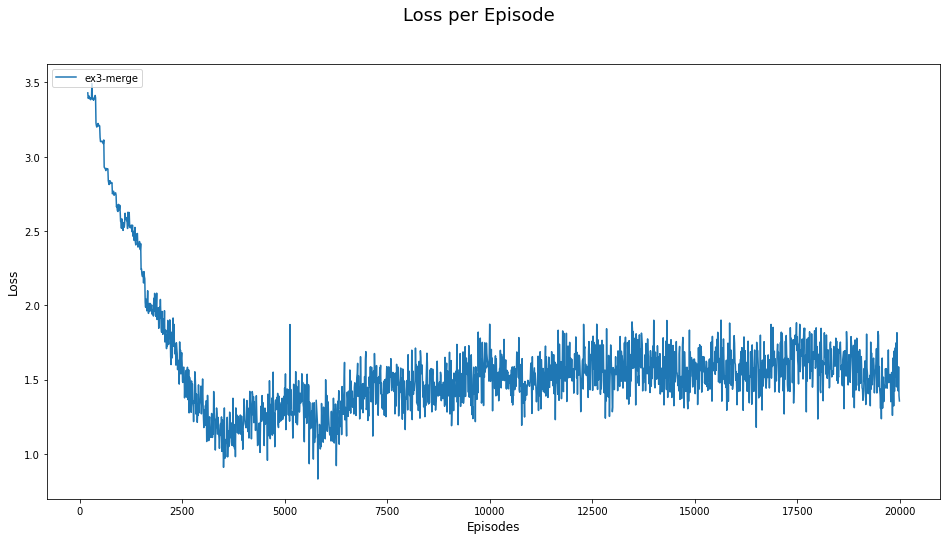

### test

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints_4/20000.checkpoint',
    log_path='logs_4',
    config_file='config_ex3.txt',
    stochastic_env=False,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='merge-v0',
    env_type='atari',
    seed=4,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

test(**test_kwargs)
show_video()

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.2, 'merging_speed_reward': -0.5, 'lane_change_reward': -0.05, 'duration': 500}

eplenmean is: 29
eprewmean is: 26.2



# **Ex3 - Roundabout-Env**

### train

INFO 2022-07-26 11:19:01,692 MainProcess 72| <ipython-input-11-de9a5de451e8> | [line:38] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<RoundaboutEnv<roundabout-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_5 (INFO)>
------------------------------------------------------------
number_timesteps: 20000
------------------------------------------------------------
save_path: 'checkpoints_5'
------------------------------------------------------------
save_interval: 1000
------------------------------------------------------------
config_file: 'config_ex3.txt'
------------------------------------------------------------
keep_training_from_checkpoint: False
------------------------------------------------------------
grad_norm: 1
------------------------------------------------------------
batch_size: 32
---

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}


INFO 2022-07-26 11:19:06,015 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 11:19:06,019 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 100 FPS 23
INFO 2022-07-26 11:19:06,023 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 4.666667
INFO 2022-07-26 11:19:06,025 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 3.626667
INFO 2022-07-26 11:19:09,429 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 11:19:09,430 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:109] | Total timesteps 200 FPS 25
INFO 2022-07-26 11:19:09,435 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eplenmean: 4.666667
INFO 2022-07-26 11:19:09,438 MainProcess 72| <ipython-input-9-d5229f28c240> | [line:112] | eprewmean: 3.626667
INFO 2022-07-26 11:19:13,551 MainProcess 72| <ipython-input-9-d5229f28c240> 

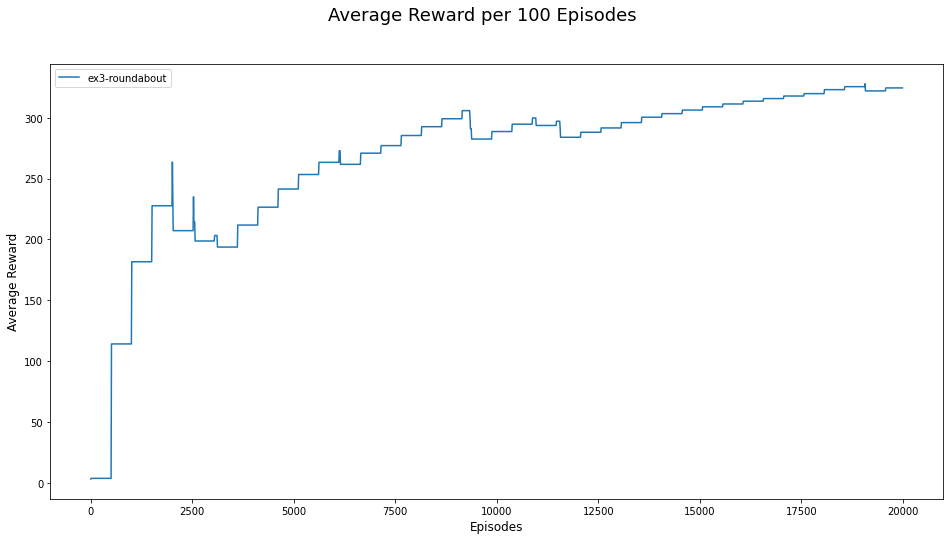

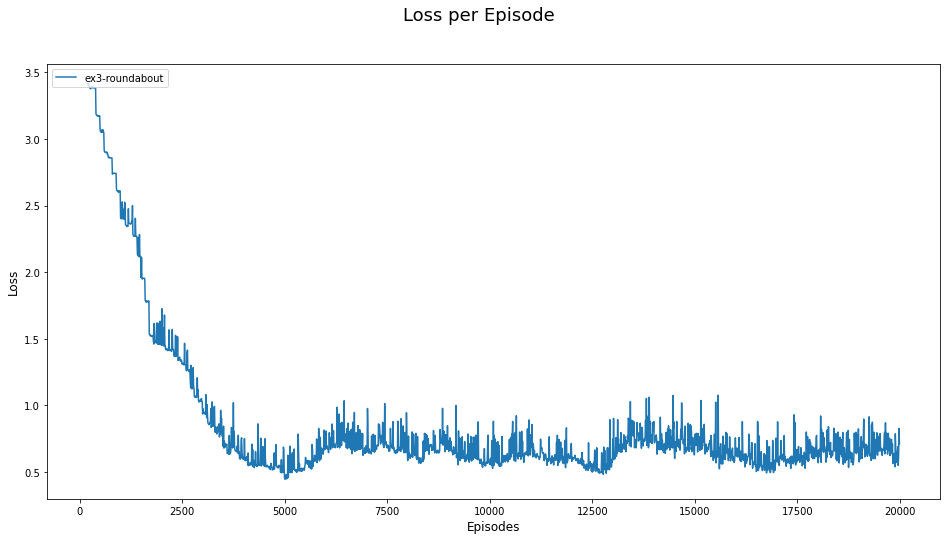

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs_5',
    logger=init_logger('logs_5'),
    env_id='roundabout-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(2e4),
    reward_scale=1.0,
    save_path='checkpoints_5',
    save_interval=int(1e3),
    config_file='config_ex3.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=10000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )

def main():
    if not os.path.isdir('checkpoints_5'):
        os.mkdir('checkpoints_5')  
    return run(**train_kwargs)
    
rewards, steps, losses = main()
plot_results([rewards], [losses], ['ex3-roundabout'])

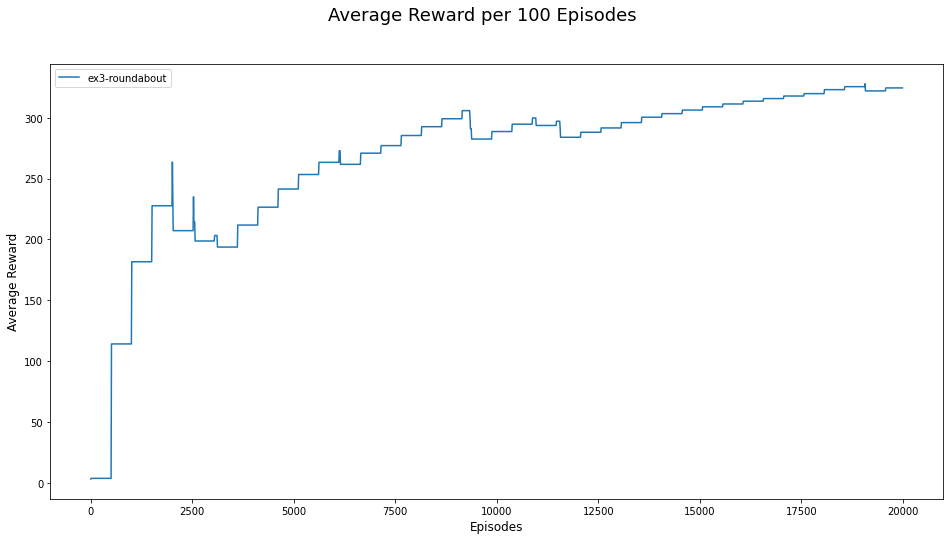

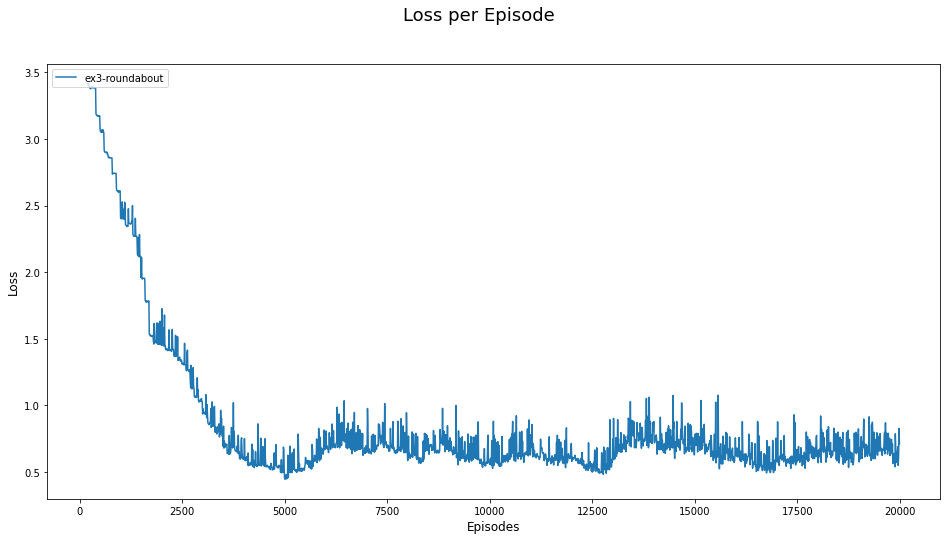

### test

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints_5/20000.checkpoint',
    log_path='logs_5',
    config_file='config_ex3.txt',
    stochastic_env=False,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='roundabout-v0',
    env_type='atari',
    seed=1,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

test(**test_kwargs)
show_video()

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}

eplenmean is: 88
eprewmean is: 85.04



# **Ex3 - SuperAgent-Env**

# first experiment

## train

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
INFO 2022-07-26 17:06:59,314 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints_6'
------------------------------------------------------------
save_interval: 5000
------------------------------------------------------------
config_file: 'co

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 17:07:04,071 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 17:07:04,072 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 21
INFO 2022-07-26 17:07:04,074 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 16.200000
INFO 2022-07-26 17:07:04,075 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 12.391450
INFO 2022-07-26 17:07:08,352 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 17:07:08,353 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 22
INFO 2022-07-26 17:07:08,354 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 20.444444
INFO 2022-07-26 17:07:08,356 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 15.798912
INFO 2022-07-26 17:07:15,021 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 17:07:15,022 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300

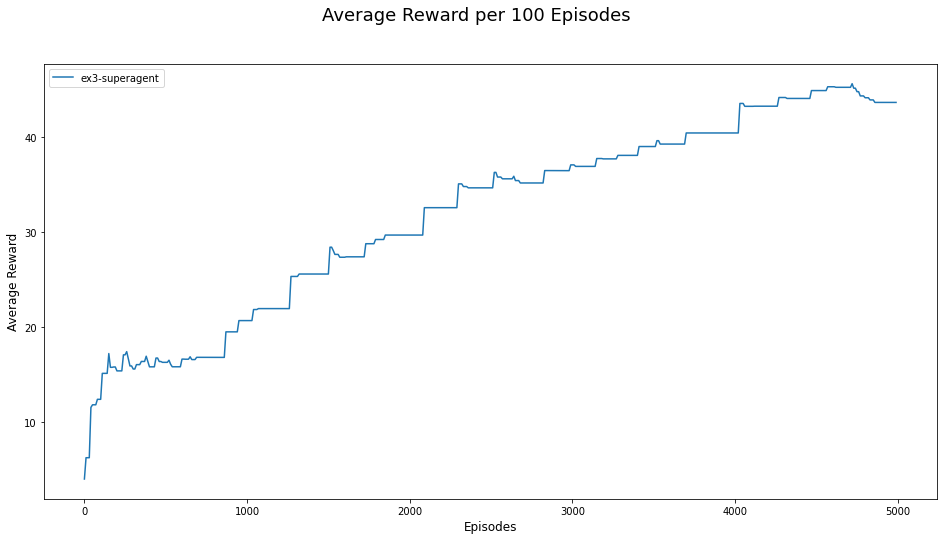

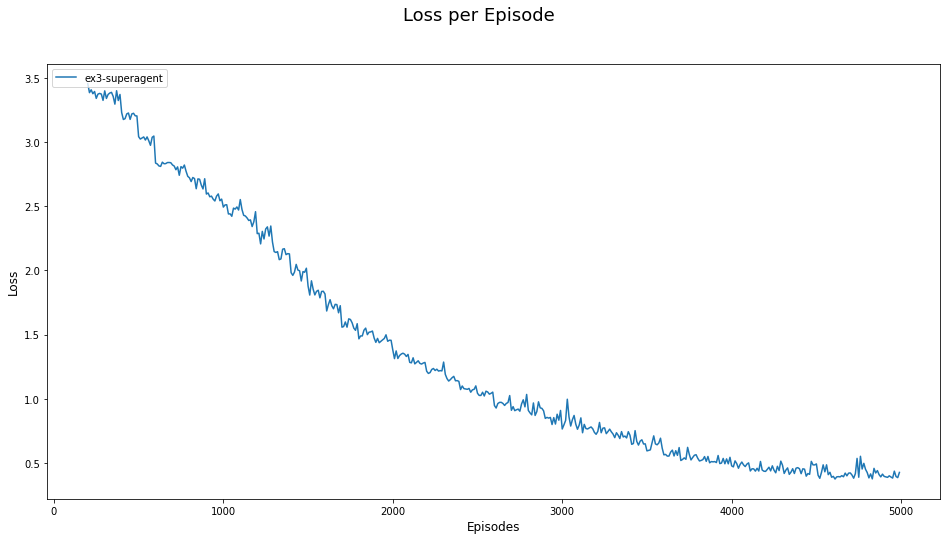

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:225: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(data=rows, columns=self.features), ignore_index=True)
INFO 2022-07-26 17:12:15,741 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<MergeEnv<merge-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.2, 'merging_speed_reward': -0.5, 'lane_change_reward': -0.05, 'duration': 500}


INFO 2022-07-26 17:12:19,377 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 17:12:19,378 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 27
INFO 2022-07-26 17:12:19,380 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 27.333333
INFO 2022-07-26 17:12:19,381 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 24.621090
INFO 2022-07-26 17:12:22,710 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 17:12:22,711 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 28
INFO 2022-07-26 17:12:22,713 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 27.000000
INFO 2022-07-26 17:12:22,714 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 23.819326
INFO 2022-07-26 17:12:27,903 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 17:12:27,904 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300

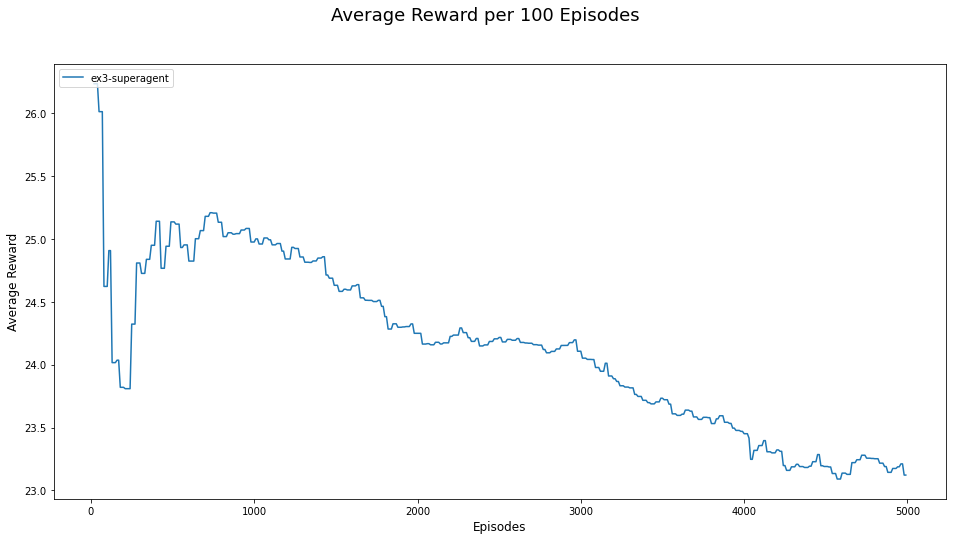

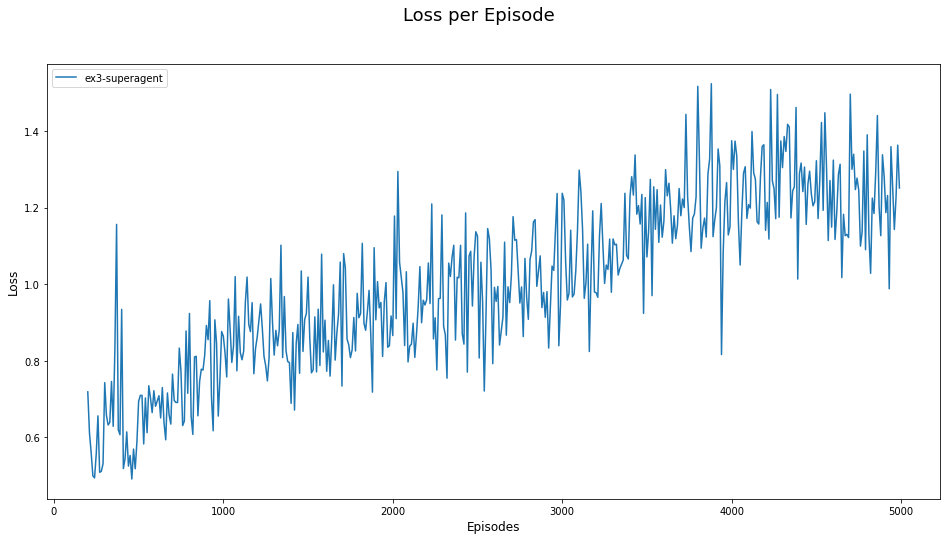

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
INFO 2022-07-26 17:16:54,570 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints_6'
------------------------------------------------------------
save_interval: 5000
------------------------------------------------------------
config_file: 'co

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 17:16:59,847 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 17:16:59,848 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 18
INFO 2022-07-26 17:16:59,850 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 16.000000
INFO 2022-07-26 17:16:59,853 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 12.431316
INFO 2022-07-26 17:17:04,239 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 17:17:04,241 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 20
INFO 2022-07-26 17:17:04,243 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 19.000000
INFO 2022-07-26 17:17:04,244 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 14.792187
INFO 2022-07-26 17:17:11,057 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 17:17:11,059 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300

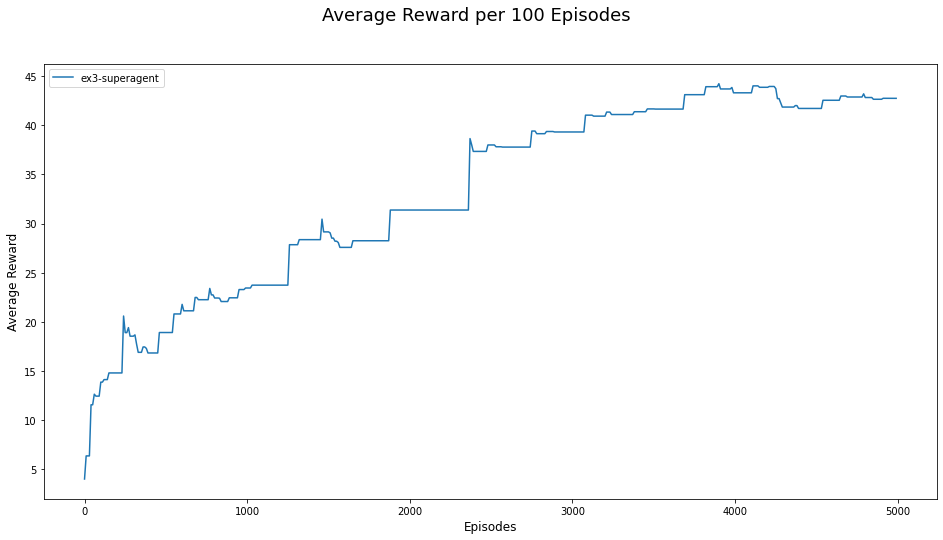

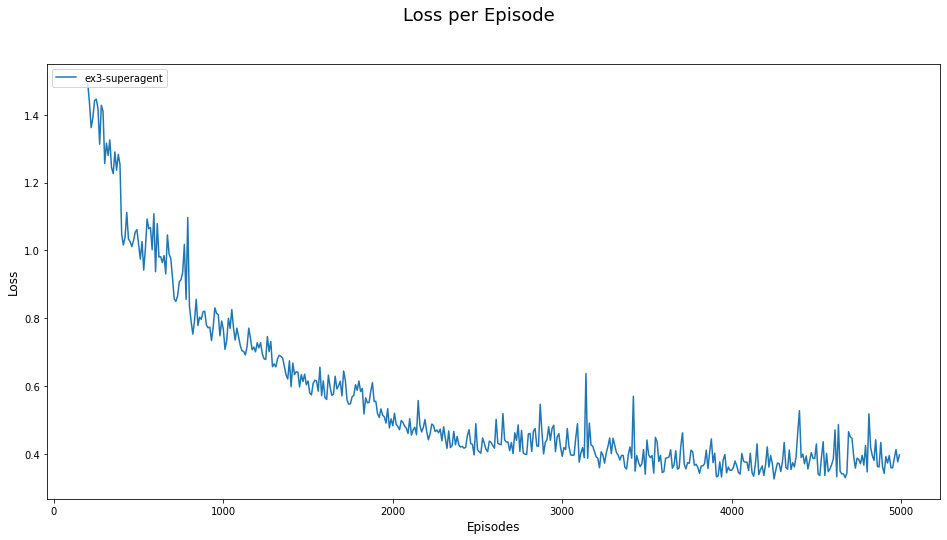

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
INFO 2022-07-26 17:22:08,353 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<RoundaboutEnv<roundabout-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints_6'
------------------------------------------------------------
save_interval: 5000
------------------------------------------------------------
config_file: 'confi

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}


INFO 2022-07-26 17:22:14,724 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 17:22:14,726 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 15
INFO 2022-07-26 17:22:14,727 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 4.000000
INFO 2022-07-26 17:22:14,728 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 3.160000
INFO 2022-07-26 17:22:20,980 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 17:22:20,981 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 15
INFO 2022-07-26 17:22:20,983 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 4.000000
INFO 2022-07-26 17:22:20,984 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 3.160000
INFO 2022-07-26 17:22:29,360 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 17:22:29,361 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300 FPS

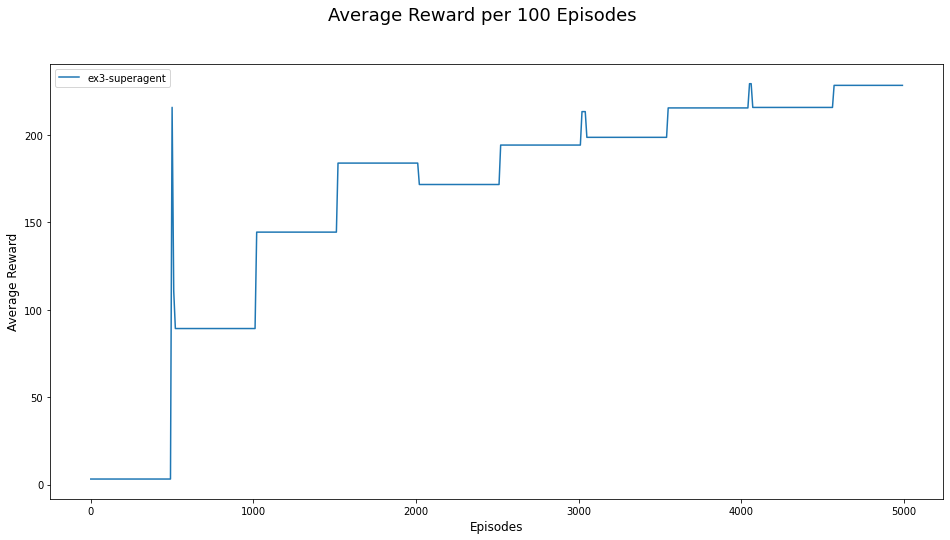

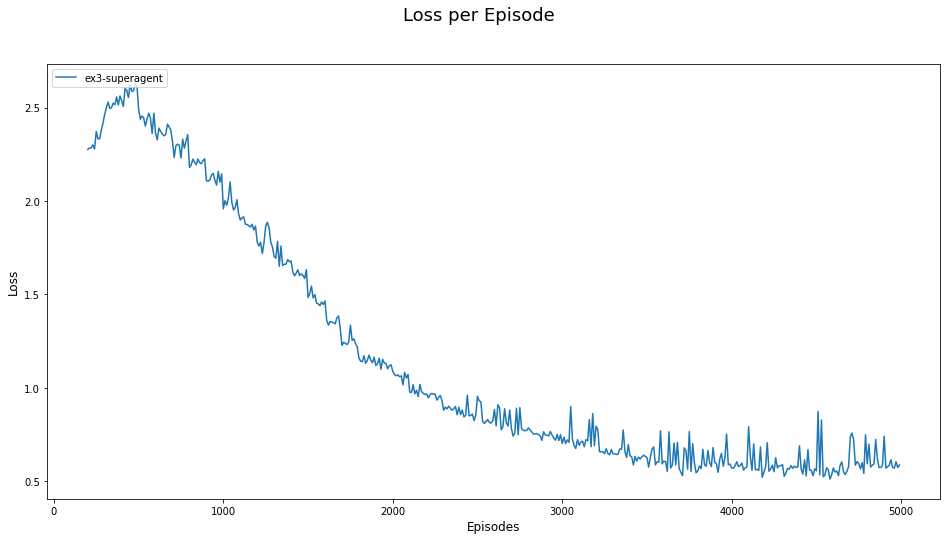

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:225: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(data=rows, columns=self.features), ignore_index=True)
INFO 2022-07-26 17:30:06,067 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<MergeEnv<merge-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.2, 'merging_speed_reward': -0.5, 'lane_change_reward': -0.05, 'duration': 500}


INFO 2022-07-26 17:30:09,095 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 17:30:09,096 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 33
INFO 2022-07-26 17:30:09,097 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 24.500000
INFO 2022-07-26 17:30:09,098 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 21.918905
INFO 2022-07-26 17:30:12,205 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 17:30:12,205 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 32
INFO 2022-07-26 17:30:12,206 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 26.000000
INFO 2022-07-26 17:30:12,208 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 22.731815
INFO 2022-07-26 17:30:16,932 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 17:30:16,933 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300

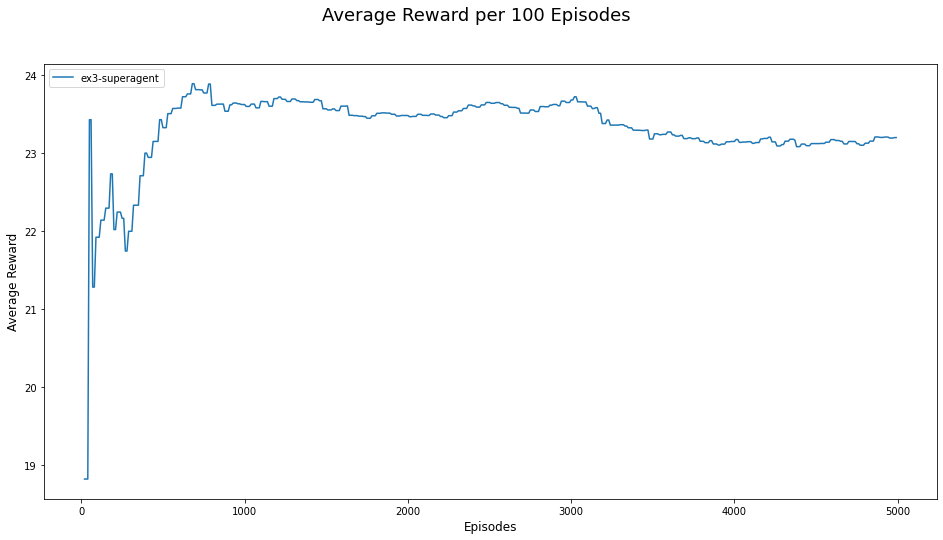

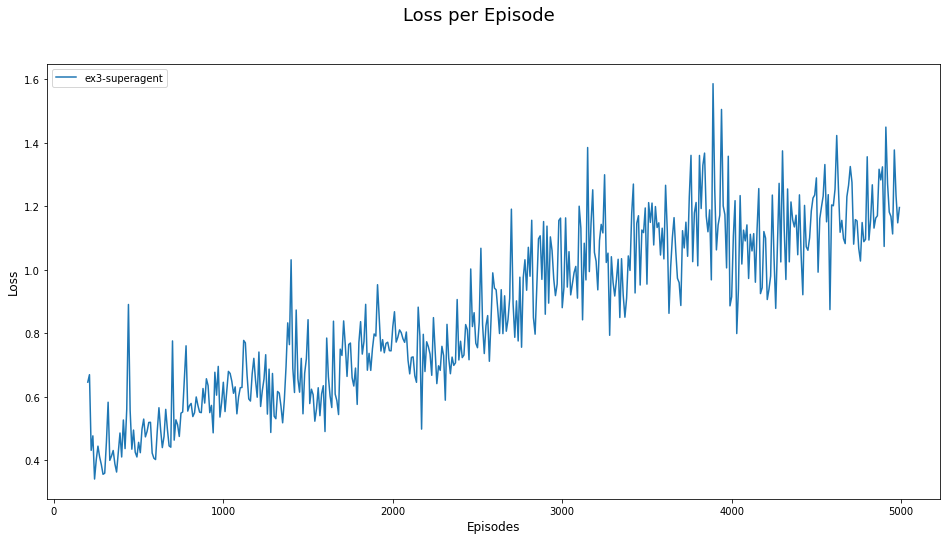

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
INFO 2022-07-26 17:34:37,783 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints_6'
------------------------------------------------------------
save_interval: 5000
------------------------------------------------------------
config_file: 'co

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


INFO 2022-07-26 17:34:42,512 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 17:34:42,513 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 21
INFO 2022-07-26 17:34:42,515 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 15.200000
INFO 2022-07-26 17:34:42,516 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 11.993075
INFO 2022-07-26 17:34:47,539 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 17:34:47,540 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 20
INFO 2022-07-26 17:34:47,541 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 17.545455
INFO 2022-07-26 17:34:47,542 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 14.023786
INFO 2022-07-26 17:34:53,759 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 17:34:53,760 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300

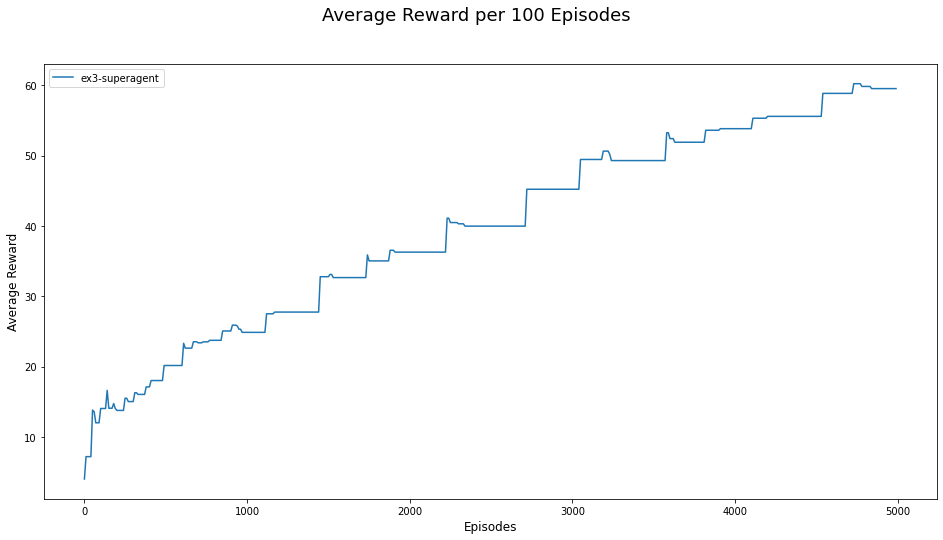

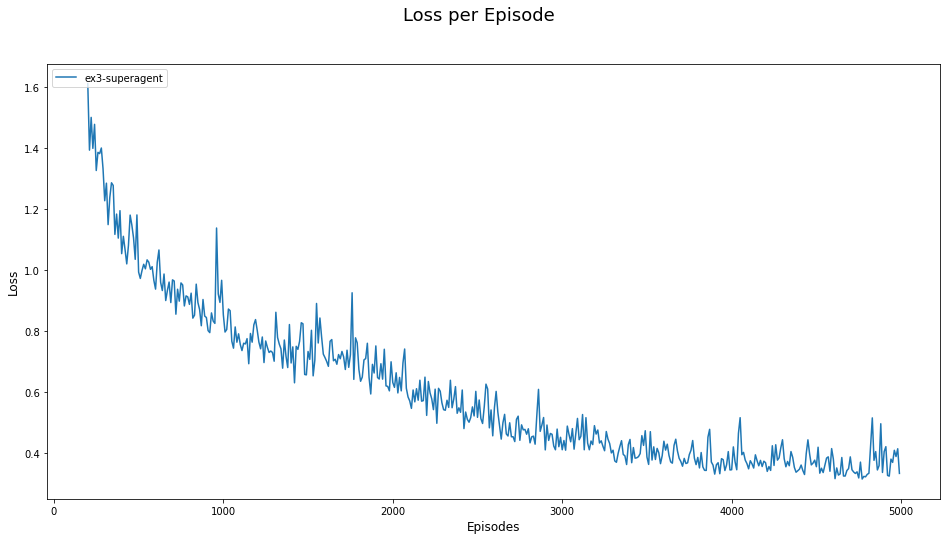

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
INFO 2022-07-26 17:40:10,757 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<RoundaboutEnv<roundabout-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------------------------------------------
number_timesteps: 5000
------------------------------------------------------------
save_path: 'checkpoints_6'
------------------------------------------------------------
save_interval: 5000
------------------------------------------------------------
config_file: 'confi

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}


INFO 2022-07-26 17:40:17,831 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 17:40:17,832 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 14
INFO 2022-07-26 17:40:17,833 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 5.333333
INFO 2022-07-26 17:40:17,834 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 4.346667
INFO 2022-07-26 17:40:25,231 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 17:40:25,233 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 13
INFO 2022-07-26 17:40:25,235 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 5.333333
INFO 2022-07-26 17:40:25,236 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 4.346667
INFO 2022-07-26 17:40:34,669 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 17:40:34,670 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300 FPS

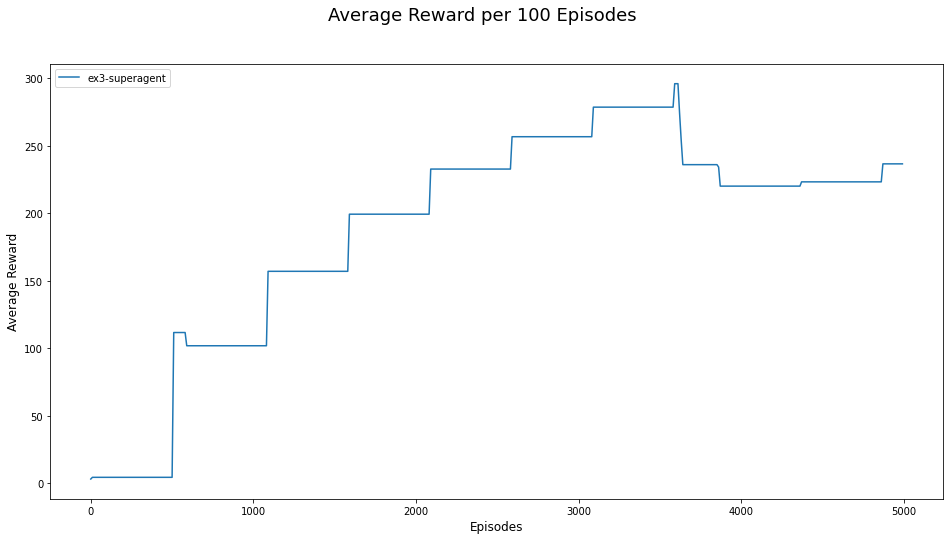

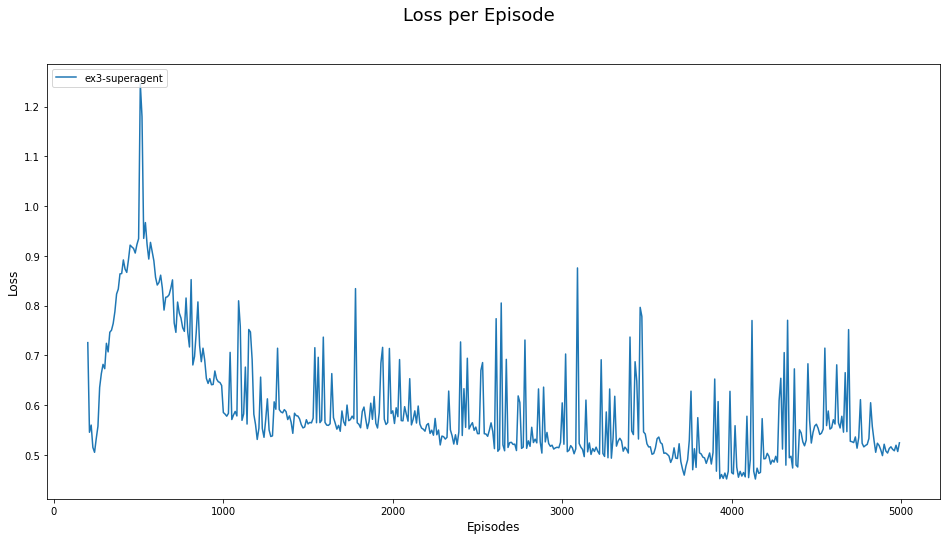

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs_6',
    logger=init_logger('logs_6'),
    env_id='highway-fast-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(5e3),
    reward_scale=1.0,
    save_path='checkpoints_6',
    save_interval=int(5e3),
    config_file='config_ex3.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=10000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )

def highway_hard_start():
    if not os.path.isdir('checkpoints_6'):
        os.mkdir('checkpoints_6')  
    rewards, steps, losses = run(**train_kwargs)
    plot_results([rewards], [losses], ['ex3-superagent'])
    
def highway_hard():
    train_kwargs['env_id']='highway-fast-v0'
    rewards, steps, losses = run(**train_kwargs)
    plot_results([rewards], [losses], ['ex3-superagent'])

def merge():
    train_kwargs['env_id']='merge-v0'
    rewards, steps, losses = run(**train_kwargs)
    plot_results([rewards], [losses], ['ex3-superagent'])

def roundabout():
    train_kwargs['env_id']='roundabout-v0'
    rewards, steps, losses = run(**train_kwargs)
    plot_results([rewards], [losses], ['ex3-superagent'])

def main():
    highway_hard_start()
    train_kwargs['keep_training_from_checkpoint']=True
    train_kwargs['lr']=1e-4
    train_kwargs['exploration_fraction']=0.01
    train_kwargs['exploration_final_eps']=0.01
    for _ in range(2):
        merge()
        highway_hard()
        roundabout()

main()

## test

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints_6/5000.checkpoint',
    log_path='logs_6',
    config_file='config_ex3.txt',
    stochastic_env=False,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='roundabout-v0',
    env_type='atari',
    seed=1,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}

eplenmean is: 500
eprewmean is: 401.64



In [ ]:
test_kwargs['env_id']='merge-v0'
test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:225: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(data=rows, columns=self.features), ignore_index=True)


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.2, 'merging_speed_reward': -0.5, 'lane_change_reward': -0.05, 'duration': 500}

eplenmean is: 36
eprewmean is: 31.62



In [ ]:
test_kwargs['env_id']='highway-fast-v0'
test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}

eplenmean is: 293
eprewmean is: 195.54



# second experiment

## update buffer

In [ ]:
def _generate(device, env, qnet, ob_scale,
              number_timesteps,
              exploration_fraction, exploration_final_eps,
              atom_num, min_value, max_value, stochastic_env):
    """ Generate training batch sample """

    env1 = env

    train_kwargs['env_id']='roundabout-v0'
    env2, _ = build_env(**train_kwargs)

    train_kwargs['env_id']='merge-v0'
    env3, _ = build_env(**train_kwargs)

    for i in range(1, int(number_timesteps/500) + 1):
        env = random.choice([env1, env2, env3])
        action_dim = env.action_space.n
        explore_steps = number_timesteps * exploration_fraction
        if atom_num > 1:
            vrange = torch.linspace(min_value, max_value, atom_num).to(device)
        o = env.reset()
        infos = dict()
        for j in range(1, 500 + 1):

            epsilon = 1.0 - (1.0 - exploration_final_eps) * (i*500+j) / explore_steps
            epsilon = max(exploration_final_eps, epsilon)

            # sample action
            with torch.no_grad():
                ob = scale_ob(np.expand_dims(o, 0), device, ob_scale)
                q = qnet(ob)
                if atom_num > 1:
                    q = (q.exp() * vrange).sum(2)
                if (random.random() < epsilon) or ((stochastic_env == True) and (random.random() < 0.15)):
                    a = int(random.random() * action_dim)
                else:
                    a = q.argmax(1).cpu().numpy()[0]
              
            o_, r, done, info = env.step(a)
            if info.get('episode'):
                infos = {
                    'eplenmean': info['episode']['l'],
                    'eprewmean': info['episode']['r'],
                }
            # return data and update observation
            yield (o, [a], [r], o_, [int(done)], infos)
            infos = dict()
            o = o_ if not done else env.reset()

## train

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
INFO 2022-07-26 17:52:49,748 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------------------------------------------
number_timesteps: 20000
------------------------------------------------------------
save_path: 'checkpoints_6'
------------------------------------------------------------
save_interval: 5000
------------------------------------------------------------
config_file: 'c

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:225: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(data=rows, columns=self.features), ignore_index=True)


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}
{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMe

INFO 2022-07-26 17:52:56,561 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 17:52:56,562 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 15
INFO 2022-07-26 17:52:56,563 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 5.000000
INFO 2022-07-26 17:52:56,564 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 3.840000
INFO 2022-07-26 17:53:02,589 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 17:53:02,590 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 15
INFO 2022-07-26 17:53:02,591 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 5.000000
INFO 2022-07-26 17:53:02,592 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 3.840000
INFO 2022-07-26 17:53:10,077 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 17:53:10,078 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300 FPS

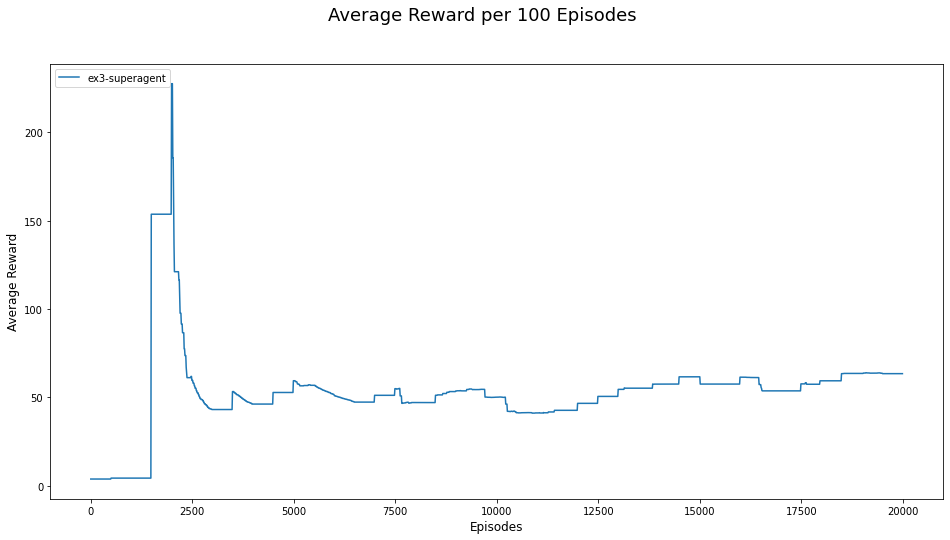

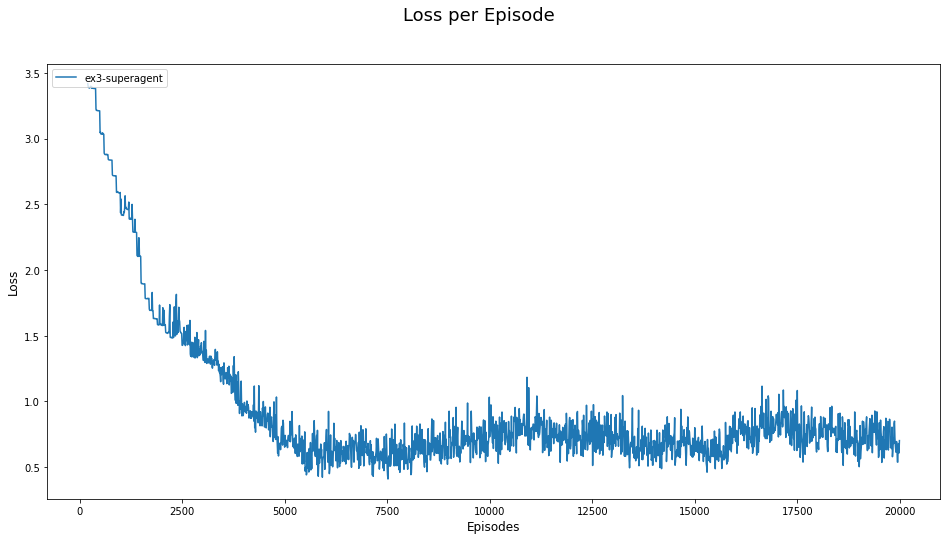

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs_6',
    logger=init_logger('logs_6'),
    env_id='highway-fast-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(2e4),
    reward_scale=1.0,
    save_path='checkpoints_6',
    save_interval=int(5e3),
    config_file='config_ex3.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=20000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )


def main():
    if not os.path.isdir('checkpoints_6'):
        os.mkdir('checkpoints_6')  
    return run(**train_kwargs)
    
rewards, steps, losses = main()
plot_results([rewards], [losses], ['ex3-superagent'])

## test

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints_6/20000.checkpoint',
    log_path='logs_6',
    config_file='config_ex3.txt',
    stochastic_env=False,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='roundabout-v0',
    env_type='atari',
    seed=3,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}

eplenmean is: 500
eprewmean is: 400.64



In [ ]:
test_kwargs['env_id']='merge-v0'
test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:225: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(data=rows, columns=self.features), ignore_index=True)


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.2, 'merging_speed_reward': -0.5, 'lane_change_reward': -0.05, 'duration': 500}

eplenmean is: 28
eprewmean is: 25.76



In [ ]:
test_kwargs['env_id']='highway-fast-v0'
test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}

eplenmean is: 500
eprewmean is: 382.02



# third experiment

## update buffer

In [ ]:
import random

def _generate(device, env, qnet, ob_scale,
              number_timesteps,
              exploration_fraction, exploration_final_eps,
              atom_num, min_value, max_value, stochastic_env):
    """ Generate training batch sample """

    env1 = env

    train_kwargs['env_id']='roundabout-v0'
    env2, _ = build_env(**train_kwargs)

    train_kwargs['env_id']='merge-v0'
    env3, _ = build_env(**train_kwargs)

    infos = dict()

    for i in range(1, int(number_timesteps/500) + 1):
        env = random.choices([env1, env2, env3], weights=(20, 60, 20), k=100)[i%100]
        action_dim = env.action_space.n
        explore_steps = number_timesteps * exploration_fraction
        if atom_num > 1:
            vrange = torch.linspace(min_value, max_value, atom_num).to(device)
        o = env.reset()
        
        for j in range(1, 500 + 1):

            epsilon = 1.0 - (1.0 - exploration_final_eps) * (i*500+j) / explore_steps
            epsilon = max(exploration_final_eps, epsilon)

            # sample action
            with torch.no_grad():
                ob = scale_ob(np.expand_dims(o, 0), device, ob_scale)
                q = qnet(ob)
                if atom_num > 1:
                    q = (q.exp() * vrange).sum(2)
                if (random.random() < epsilon) or ((stochastic_env == True) and (random.random() < 0.15)):
                    a = int(random.random() * action_dim)
                else:
                    a = q.argmax(1).cpu().numpy()[0]
              
            o_, r, done, info = env.step(a)
            if info.get('episode'):
                infos = {
                    'eplenmean': info['episode']['l'],
                    'eprewmean': info['episode']['r'],
                }
            # return data and update observation
            yield (o, [a], [r], o_, [int(done)], infos)
            infos = dict()
            o = o_ if not done else env.reset()

### train

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
INFO 2022-07-26 18:31:41,379 MainProcess 1880| 1304442574.py | [line:37] | Start training `dqn` on `<FrameStack<ClipRewardEnv<WarpFrame<Info<OrderEnforcing<HighwayEnvFast<highway-fast-v0>>>>>>>` with settings 
------------------------------------------------------------
device: device(type='cuda')
------------------------------------------------------------
logger: <Logger logs_6 (INFO)>
------------------------------------------------------------
number_timesteps: 30000
------------------------------------------------------------
save_path: 'checkpoints_6'
------------------------------------------------------------
save_interval: 5000
------------------------------------------------------------
config_file: 'c

{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}


C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:225: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(data=rows, columns=self.features), ignore_index=True)


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}
{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMe

INFO 2022-07-26 18:31:48,014 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 100 ==========
INFO 2022-07-26 18:31:48,014 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 100 FPS 15
INFO 2022-07-26 18:31:48,015 MainProcess 1880| 508815791.py | [line:112] | eplenmean: nan
INFO 2022-07-26 18:31:48,017 MainProcess 1880| 508815791.py | [line:112] | eprewmean: nan
INFO 2022-07-26 18:31:53,627 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 200 ==========
INFO 2022-07-26 18:31:53,628 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 200 FPS 16
INFO 2022-07-26 18:31:53,629 MainProcess 1880| 508815791.py | [line:112] | eplenmean: 183.000000
INFO 2022-07-26 18:31:53,630 MainProcess 1880| 508815791.py | [line:112] | eprewmean: 161.760000
INFO 2022-07-26 18:32:00,697 MainProcess 1880| 508815791.py | [line:107] | ========== Iter 300 ==========
INFO 2022-07-26 18:32:00,698 MainProcess 1880| 508815791.py | [line:109] | Total timesteps 300 FPS 15
IN

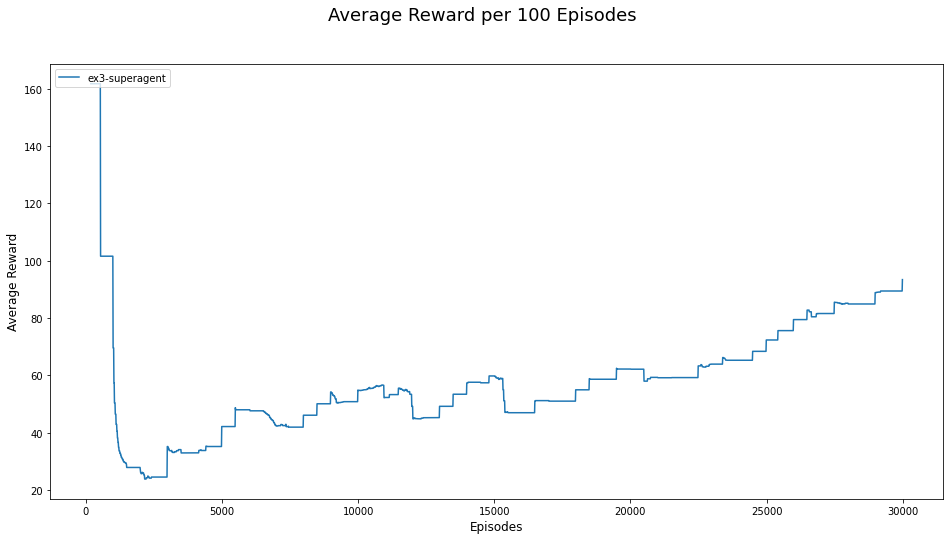

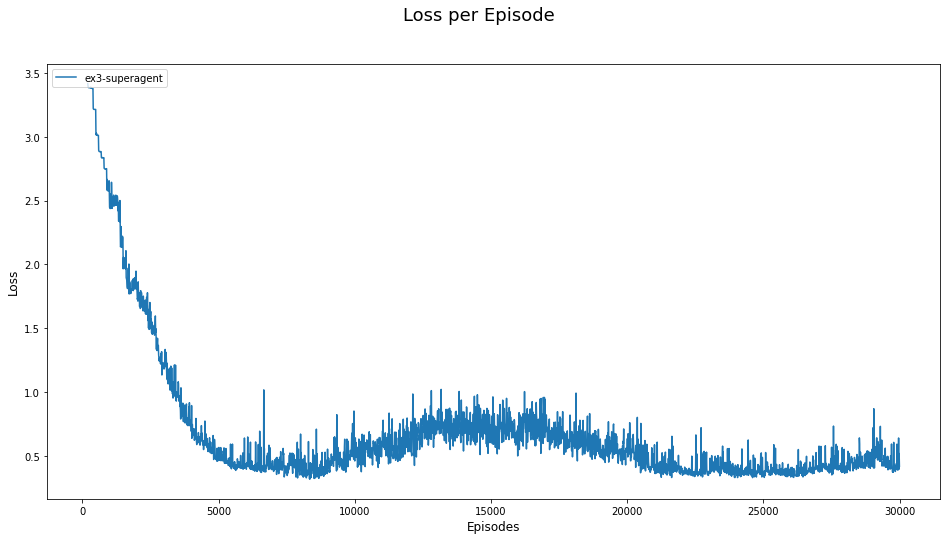

In [ ]:
train_kwargs = dict(
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu'),
    log_path='logs_6',
    logger=init_logger('logs_6'),
    env_id='highway-fast-v0',
    algorithm='dqn',
    nenv=1,
    env_type='atari',
    seed=0,
    number_timesteps=int(3e4),
    reward_scale=1.0,
    save_path='checkpoints_6',
    save_interval=int(5e3),
    config_file='config_ex3.txt',
    keep_training_from_checkpoint=False,
    grad_norm=1,
    batch_size=32,
    double_q=False,
    buffer_size=10000,
    exploration_fraction=0.2,
    exploration_final_eps=0.01,
    stochastic_env = True,
    train_freq=1,
    learning_starts=200,
    target_network_update_freq=100,
    gamma=0.9,
    prioritized_replay=True,
    prioritized_replay_alpha=0.6,
    prioritized_replay_beta0=0.4,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4
    )


def main():
    if not os.path.isdir('checkpoints_6'):
        os.mkdir('checkpoints_6')  
    return run(**train_kwargs)
    
rewards, steps, losses = main()
plot_results([rewards], [losses], ['ex3-superagent'])

## test

In [ ]:
test_kwargs = dict(
    checkpoint_path='checkpoints_6/30000.checkpoint',
    log_path='logs_6',
    config_file='config_ex3.txt',
    stochastic_env=False,
    dueling=True,
    atom_num=51,
    min_value=-10,
    max_value=10,
    ob_scale=1 / 255.0,
    lr=5e-4, 
    env_id='roundabout-v0',
    env_type='atari',
    seed=15,
    reward_scale=1.0,
    device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    )

In [ ]:
test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction', 'target_speeds': [0, 8, 16]}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 600, 'centering_position': [0.5, 0.6], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'incoming_vehicle_destination': None, 'collision_reward': -1, 'high_speed_reward': 0.2, 'right_lane_reward': 0, 'lane_change_reward': -0.05, 'duration': 500}

eplenmean is: 500
eprewmean is: 400.92



In [ ]:
test_kwargs['env_id']='merge-v0'
test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(
C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:225: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame(data=rows, columns=self.features), ignore_index=True)


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 15, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.2, 'merging_speed_reward': -0.5, 'lane_change_reward': -0.05, 'duration': 500}

eplenmean is: 26
eprewmean is: 23.76



In [ ]:
test_kwargs['env_id']='highway-fast-v0'
test(**test_kwargs)
show_video()

C:\Users\VZV28N\Anaconda3_64bit\envs\rl\lib\site-packages\highway_env\envs\common\observation.py:215: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame.from_records(


{'observation': {'vehicles_count': 30, 'vehicles_density': 15, 'type': 'GrayscaleObservation', 'observation_shape': (128, 128), 'stack_size': 4, 'weights': [0.2989, 0.587, 0.114], 'scaling': 1.75}, 'action': {'type': 'DiscreteMetaAction'}, 'simulation_frequency': 5, 'policy_frequency': 2, 'other_vehicles_type': 'highway_env.vehicle.behavior.IDMVehicle', 'screen_width': 600, 'screen_height': 150, 'centering_position': [0.3, 0.5], 'scaling': 5.5, 'show_trajectories': False, 'render_agent': True, 'offscreen_rendering': False, 'manual_control': False, 'real_time_rendering': False, 'lanes_count': 3, 'vehicles_count': 20, 'controlled_vehicles': 1, 'initial_lane_id': None, 'duration': 500, 'ego_spacing': 1.5, 'vehicles_density': 1, 'collision_reward': -1, 'right_lane_reward': 0.1, 'high_speed_reward': 0.4, 'lane_change_reward': 0, 'reward_speed_range': [20, 30], 'offroad_terminal': False}

eplenmean is: 500
eprewmean is: 369.7

